<h1 align="center"><strong><font size="6"> The Soccer-Factor-Model <br> Identifying a Soccer-Player's Skill/Ability via Bayesian Logistic Regression </h1></strong></font>

(Actually, it's football, the *jogo bonito* that you play with your feet. But oddly, Americans call it *soccer*.)

Welcome to the notebook hosting the **Soccer-Factor-Model** (SFM). Before jumping into a short introduction into what the SFM actually is, I would like to make a few remarks upfront:

1. The SFM is not confined to soccer only, but can easliy be adpated to all kinds of other sports: football, baseball, basketball, Formula 1, etc. The only requirement: **data on individual players and/or teams**.

2. The model itself is implemented with the enormous help of **[#PyMC](https://www.pymc.io/welcome.html)**.

3. Given that **[#PyMC](https://www.pymc.io/welcome.html)** thankfully does all the heavy work, the actual **star** of the analysis is not the model construction and estimation, but rather the data/feature engineering part.

The number of *factors* we can build and their informative value, depends obviously on the data that is available to us. For the following exercise, I depend on publicly available data free of charge. That is already a limitation for producing a meaningful model.

However, I guess I found a decent dataset, which I pulled from [#Kaggle](https://www.kaggle.com/datasets/marclamyhshshs/premier-league-games?select=clean_players_info.csv).
All credits for that dataset go to [Marc Lamyhshshs](https://www.kaggle.com/marclamyhshshs).
It comprises all Premier League matches since 1992, which allows us to look at some very, very, very interesting players!

The amount of data is surely impressive! This allows us to create some interesting *factors*.

To showcase how SFM works, I chose to construct the following ones:

- `goalsscored_diff`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; The current difference of *goals scored* by player $i$'s team and the opponent-team
- `goalsscored_rank_team`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; The current ranking of player $i$'s team in *goals scored*
- `goalsscored_rank_team_wo_player`: &emsp; The current ranking of player $i$'s team in *goals scored*, not accounting for <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&emsp;&emsp; the number of goals scored by player $i$
- `goalsconceded_rank_opp`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&emsp; The current ranking of the opponent-team in *goals conceded*
- `points_diff`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&emsp;&emsp; The difference in points of the player's team and the opponent
- `goal_balance_team`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; The difference between *goals scored* and *goals conceded* of the team which <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&emsp;&emsp; our player of interest is playing for
- `goal_balance_opp`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; The difference between *goals scored* and *goals conceded* of the opponent-team which <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&emsp;&emsp; our player of interest is playing against in match $m$
- `goal_balance_diff`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; The difference between `goal_balance_team` and `goal_balance_opp`

Throughout the notebook, I attached some questions about whether a given factor is actually related to team-effort or actually an indication of a player's strength. If the latter were true, we should exclude that particular factor as our model would be mis-specified! Or we would just hope that the posterior of the corresponding loading is centered around zero with only little variance...

<font color='darkred'>**Lastly:**</font> This list of factors is by no means comprehensive and much more creative minds might already have thought of many more fancy factors to build from the underlying data.
Feel free to build your own factors! Data on `shots_home` and `shots_away` sound to have potential to form other interesting explanatory variables that I haven't included yet!

## Data preparation

In [1]:
#!pip install -qq pymc -U
#!pip install -qq jax -U
#!pip install -qq numpyro -U
#!pip install -qq -U ipywidgets

In [2]:
from typing import List, Union

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor.tensor as pt
import seaborn as sns
import xarray as xr
from matplotlib.lines import Line2D
from sklearn.preprocessing import StandardScaler
import matplotlib.lines as mlines

pm.__version__

'5.16.2'

In [3]:
az.style.use("arviz-whitegrid")
plt.rcParams["figure.figsize"] = [12, 5]
%config InlineBackend.figure_format = 'retina'
seed = sum(map(ord, "sfm"))
rng = np.random.default_rng(seed)

In [4]:
# RLPs = pd.Index(
#     [
#         "harry kewell",
#         "jermain defoe",
#         "nicolas anelka",
#         "robbie fowler",
#         "robbie keane",
#         "robert pires",
#     ],
# ).sort_values()

factors_numeric = ["points_diff"]
factors = ["home_pitch"] + factors_numeric

In [5]:
RLPs = pd.Index(
    [
        'ricardo-quaresma',
        'hugo-almeida',
        'joao-felix',
        'helder-postiga',
        'andre-silva',
        'luis-fabiano',
        'ailton',
        'paulo-sergio',
        'giovane-elber',
        'diego-milito',
        'aritz-aduriz',
        'fernando-llorente',
        'joseba-llorente',
        'joselu',
        'jose-antonio-reyes',
        'iago-aspas',
        'nolito',
        'adrian-lopez',
        'jonathan-soriano',
        'manu-del-moral',
        'michu',
        'sergio-garcia',
        'edinson-cavani',
        'diego-forlan',
        'lorenzo-insigne',
        'luca-toni',
        'alberto-gilardino',
        'filippo-inzaghi',
        'ciro-immobile',
        'emanuele-giaccherini',
        'fabio-quagliarella',
        'antonio-di-natale',
        'giampaolo-pazzini',
        'marco-borriello',
        'graziano-pelle',
        'antonio-cassano',
        'alberto-paloschi',
        'christian-vieri',
        'miroslav-klose',
        'mario-gomez',
        'oliver-neuville',
        'carsten-jancker',
        'alexander-zickler',
        'lukas-podolski',
        'nils-petersen',
        'julian-schieber',
        'niclas-fuellkrug',
        'stefan-kiessling',
        'jamie-vardy',
        'bobby-zamora',
        'emile-heskey',
        'peter-crouch',
        'jermain-defoe',
        'alan-shearer',
        'david-nugent',
        'alexandre-lacazette',
        'olivier-giroud',
        'nicolas-anelka',
        'hatem-ben-arfa',
        'antoine-griezmann',
        'bafetimbi-gomis',
        'jimmy-briand',
        'wissam-ben-yedder',
        'robbie-keane',
        'leon-best',
        'craig-bellamy',
        'kenny-miller',
        'arkadiusz-milik',
        'klaas-jan-huntelaar',
        'roy-makaay',
        'henrik-larsson',
        'john-guidetti',
        'markus-rosenberg',
        'johan-elmander',
        'marcus-berg',
        'john-carew',
        'ebbe-sand',
        'jon-dahl-tomasson',
        'christian-benteke',
        'emile-mpenza',
        'dries-mertens',
        'ivica-olic',
        'mladen-petric',
        'davor-suker',
        'ivan-klasnic',
        'nikola-kalinic',
        'lucas-barrios',
        'jackson',
        'carlos-bacca',
        'dimitar-berbatov',
        'adam-szalai',
        'inaki-williams',
        'eric-maxim-choupo-moting',
        'pierre-emerick-aubameyang',
        'marek-mintal',
        'heung-min-son',
        'clint-dempsey',
        'jozy-altidore',
        'giovani-dos-santos',
        'carlos-vela',
        'raul-jimenez',
        'tim-cahill',
    ]
).sort_values()

elite_players = ['cristiano-ronaldo',
 'nani',
 'ronaldo',
 'neymar',
 'pato',
 'ronaldinho',
 'diego-costa',
 'adriano',
 'robinho',
 'roberto-firmino',
 'lionel-messi',
 'gonzalo-higuain',
 'sergio-aguero',
 'mauro-icardi',
 'paulo-dybala',
 'david-villa',
 'fernando-torres',
 'raul',
 'alvaro-morata',
 'luis-suarez-2',
 'alessandro-del-piero',
 'wayne-rooney',
 'harry-kane',
 'michael-owen',
 'thierry-henry',
 'karim-benzema',
 'gareth-bale',
 'robert-lewandowski',
 'ruud-van-nistelrooy',
 'robin-van-persie',
 'arjen-robben',
 'zlatan-ibrahimovic',
 'erling-haaland',
 'romelu-lukaku',
 'eden-hazard',
 'mario-mandzukic',
 'falcao',
 'andriy-shevchenko',
 'didier-drogba',
 'samuel-etoo',
 'mohamed-salah',
 'chicharito']

In [6]:
RLPs = sorted(
    [
        'ricardo-quaresma',
        'hugo-almeida',
        'joao-felix',
        'helder-postiga',
        'andre-silva',
        'luis-fabiano',
        'ailton',
        'paulo-sergio',
    ]
)

elite_players = sorted(
    [
        'cristiano-ronaldo',
        'lionel-messi',
        'nani',
        'ronaldo',
        'neymar',
        'pato',
        'ronaldinho',
        'diego-costa',
        'michael-owen',
        'thierry-henry',
        'wayne-rooney',
    ]
)

players_ordered = pd.Index(elite_players + RLPs)

In [7]:
complete_data = pd.read_csv("../10_data/SFM_data_byPlayer.csv")

complete_data["goal"] = complete_data["goal"].astype(int)
complete_data["goals_in_match"] = complete_data["goals_in_match"].astype(int)

complete_data["kick_off"] = pd.to_datetime(
    complete_data["kick_off"], yearfirst=True
).dt.normalize()

# compute season number for each player, ~maturity of player
complete_data["season_nbr"] = complete_data.groupby(["name_player"])[
    "season"
].transform(lambda x: x.factorize(sort=True)[0])

# compute days since first game of the season for each player
# aka within-season effects
# complete_data["days_since_first_game"] = complete_data.groupby(
#     ["name_player", "season"]
# )["kickoff_dt"].transform(lambda x: (x - x.min()).dt.days)

complete_data["is_rlp"] = complete_data.name_player.isin(RLPs).astype(int)

complete_data = complete_data[complete_data.name_player.isin(players_ordered)].sort_values(["name_player", "kick_off"]).reset_index(
    drop=True
)

# players = pd.factorize(complete_data["name_player"], sort=True)[1]
# players_ordered = players.difference(RLPs).append(RLPs)

complete_data

,goal,goals_in_match,goals_in_first_half,goals_in_second_half,goals_scored_avg_minutes_left,points_team,points_opp,goalsscored_inGame_team,goalsscored_inGame_opp,goalsscored_cum_team,...,goalsconceded_rank_team,goalsscored_diff,goal_balance_team,goal_balance_opp,goal_balance_diff,points_diff,goalsscored_share_player_team,name_player,season_nbr,is_rlp
0,0,0,0.0,0.0,0.0,3.0,6.0,1.0,2.0,5.0,...,11.0,-2.0,0.0,3.0,-3.0,-3.0,0.000000,ailton,0,1
1,1,1,0.0,1.0,40.0,3.0,10.0,1.0,1.0,6.0,...,14.0,-4.0,-1.0,8.0,-9.0,-7.0,0.000000,ailton,0,1
2,0,0,0.0,0.0,0.0,4.0,9.0,1.0,1.0,7.0,...,12.0,-2.0,-1.0,3.0,-4.0,-5.0,0.142857,ailton,0,1
3,1,1,0.0,1.0,36.0,5.0,9.0,1.0,0.0,8.0,...,8.5,-2.0,-1.0,5.0,-6.0,-4.0,0.125000,ailton,0,1
4,1,1,0.0,1.0,0.0,8.0,11.0,3.0,3.0,9.0,...,8.0,1.0,0.0,0.0,0.0,-3.0,0.222222,ailton,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4036,0,0,0.0,0.0,0.0,40.0,81.0,1.0,3.0,37.0,...,16.0,-48.0,-13.0,65.0,-78.0,-41.0,0.270270,wayne-rooney,15,0
4037,0,0,0.0,0.0,0.0,40.0,66.0,0.0,0.0,38.0,...,16.5,-37.0,-15.0,40.0,-55.0,-26.0,0.263158,wayne-rooney,15,0
4038,0,0,0.0,0.0,0.0,41.0,32.0,1.0,1.0,38.0,...,15.5,12.0,-15.0,-19.0,4.0,9.0,0.263158,wayne-rooney,15,0
4039,0,0,0.0,0.0,0.0,42.0,41.0,1.0,0.0,39.0,...,15.0,4.0,-15.0,-7.0,-8.0,1.0,0.256410,wayne-rooney,15,0


In [8]:
assert complete_data["name_player"].sort_values().unique().shape[0] == (len(RLPs) + len(elite_players))

### Factor standardization

In [9]:
factors_numeric_train = complete_data[factors_numeric]

scaler = StandardScaler()
# Fit the scaler on the training data and transform the data
factors_numeric_sdz = pd.DataFrame(scaler.fit_transform(factors_numeric_train), columns=factors_numeric)

# Add the non-numeric factor to the standardized DataFrame
factors_sdz = factors_numeric_sdz.copy()
factors_sdz["home_pitch"] = complete_data["home_pitch"]

# make sure the order is the same as the PyMC coords later on
factors_sdz = factors_sdz[factors]

Let's give a good look at the frequency of each count in the data. First in terms of probability:

In [10]:
complete_data["goals_in_match"].value_counts(normalize=True).round(4)

goals_in_match
0    0.6164
1    0.2683
2    0.0888
3    0.0225
4    0.0035
5    0.0005
Name: proportion, dtype: float64

Then raw counts:

In [11]:
complete_data["goals_in_match"].value_counts()

goals_in_match
0    2491
1    1084
2     359
3      91
4      14
5       2
Name: count, dtype: int64

In [12]:
complete_data[complete_data["goals_in_match"] > 3].shape[0] / complete_data.shape[0]

0.003959415986142044

**The counts for 3+ goals are extremely rare compared to 0, 1 and 2 goals**. This means using a Poisson likelihood is not really appropriate, as the Poisson expects much higher counts on the right tail of the distribution.

In this case, it makes more sense to use a **Categorical likelihood with categories $[0, 1, 2, 3+]$**. That may sound counter-intuitive, as in theory the number of goals a player can score per game has no upper bound (hence the Poisson), but in practice, we see this number exceeds 2 less than 2% of the time.

As a result, lumping together any observations equal or higher to 3, and treating each of the 4 events as a distinct category, with its own probability of success, makes more sense and allows for a more sensical model.

In [13]:
# lump together values >= 3
complete_data["goals_cats"] = np.where(
    complete_data["goals_in_match"] >= 3, 3, complete_data["goals_in_match"]
)

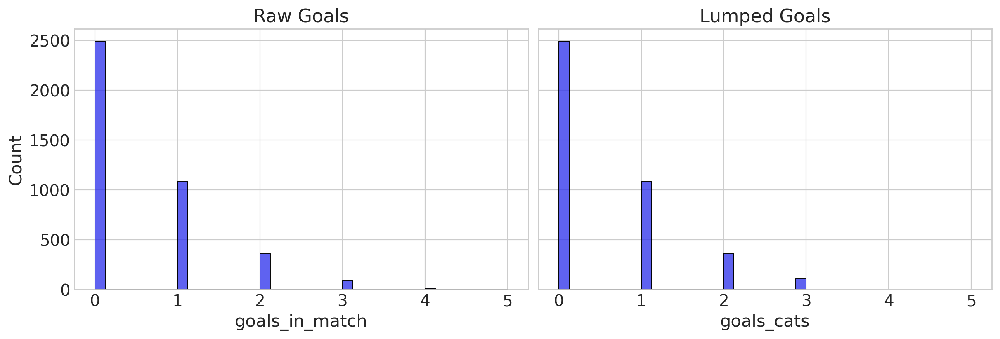

In [14]:
_, (left, right) = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(12, 4))
sns.histplot(complete_data, x="goals_in_match", ax=left)
left.set(title="Raw Goals")
sns.histplot(complete_data, x="goals_cats", ax=right)
right.set(title="Lumped Goals");

We can see that this virtually doesn't change anything, because the frequencies are so low for high counts. We can now implement the model.

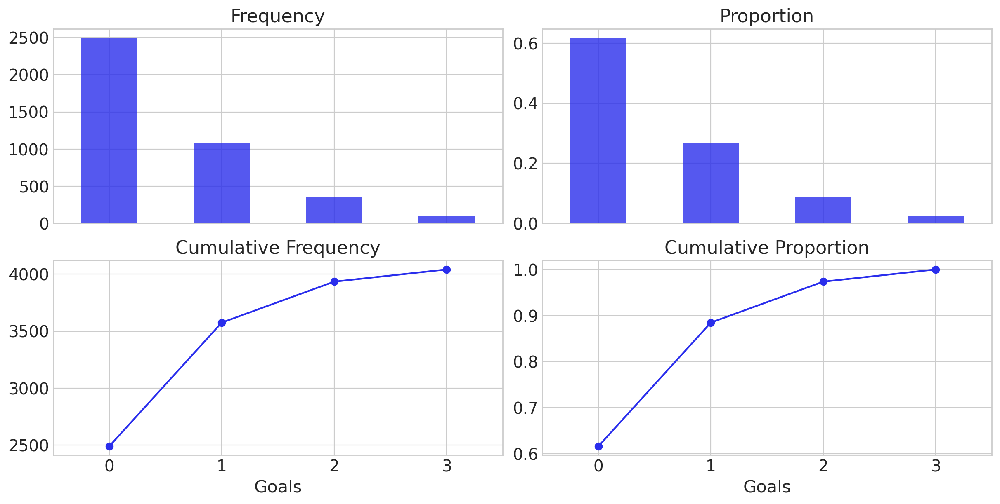

In [15]:
_, axes = plt.subplot_mosaic(
    [
        ["Frequency", "Proportion"],
        ["Cumulative Frequency", "Cumulative Proportion"],
    ],
    figsize=(12, 6),
    sharex=True,
    layout="constrained",
)

complete_data["goals_cats"].sort_values().value_counts(sort=False).plot(
    kind="bar", alpha=0.8, rot=0, ax=axes["Frequency"]
)
axes["Frequency"].set(xlabel="Goals", title="Frequency")

complete_data["goals_cats"].sort_values().value_counts(sort=False, normalize=True).plot(
    kind="bar", alpha=0.8, rot=0, ax=axes["Proportion"]
)
axes["Proportion"].set(xlabel="Goals", title="Proportion")

complete_data["goals_cats"].sort_values().value_counts(sort=False).cumsum().plot(
    marker="o", rot=0, ax=axes["Cumulative Frequency"]
)
axes["Cumulative Frequency"].set(xlabel="Goals", title="Cumulative Frequency")

complete_data["goals_cats"].sort_values().value_counts(
    sort=False, normalize=True
).cumsum().plot(marker="o", rot=0, ax=axes["Cumulative Proportion"])
axes["Cumulative Proportion"].set(xlabel="Goals", title="Cumulative Proportion");

In [16]:
complete_data["goals_cats"].sort_values().value_counts(sort=False).cumsum()

goals_cats
0    2491
1    3575
2    3934
3    4041
Name: count, dtype: int64

In [17]:
complete_data["goals_cats"].sort_values().value_counts(sort=False, normalize=True)

goals_cats
0    0.616432
1    0.268250
2    0.088839
3    0.026479
Name: proportion, dtype: float64

## HSGP Parameters

In the model below, we use a linear trend on the season term for each player. That's because we assume that the effects of maturity, as we call it, are mostly non-linear for each player: all else being equal, we don't expect players to _suddenly_ become very good or very bad.

Once we've taken this trend into account though, we do envision possibilities for the goal performance of a player to exhibit non-linear fluctuations (they got injured and don't come back well; they didn't prepare well enough during the summer and lag behind in the second half of the season; on the contrary, they prepared too strongly during the summer and are exhausted once Spring arrives, etc.).

To handle these effects, we'll use the new [Hilbert-Space decomposition](https://arxiv.org/abs/2004.11408) of the Gaussian Process (HSGP), which is also [available in PyMC](https://www.pymc.io/projects/docs/en/stable/api/gp/generated/pymc.gp.HSGP.html). So instead of using a classic linear trend on `days_since_first_week` (as we do on `season`), we'll use an HSGP.

### Choosing the approximation parameters

HSGP is mainly defined by two parameters, `m` and `c`, respectively the number of basis vectors and the multiplier determining the boundary of the approximation (see [this](https://www.pymc.io/projects/examples/en/latest/gaussian_processes/HSGP-Basic.html) for more details). PyMC actually has a helper function to help us choose `m` and `c`:

In [18]:
m, c = pm.gp.hsgp_approx.approx_hsgp_hyperparams(
    x_range=[1, complete_data.gameday.max()],
    lengthscale_range=[2, 20],
    cov_func="matern52",
)

print("Recommended smallest number of basis vectors (m):", m)
print("Recommended smallest scaling factor (c):", np.round(c, 1))

Recommended smallest number of basis vectors (m): 108
Recommended smallest scaling factor (c): 4.4


That actually looks a bit too low, especially `c`. Thankfully, we can check the computation by hand: we can use the `c` from above and check the implied `L`, which is the result of `set_boundary`:

In [19]:
pm.gp.hsgp_approx.set_boundary(complete_data["gameday"].to_numpy(), c)

array(82.)

What does this mean? Well, `L` has a pretty [interpretable meaning](https://www.pymc.io/projects/examples/en/latest/gaussian_processes/HSGP-Basic.html#choosing-the-hsgp-approximation-parameters-m-l-and-c) in the HSGP decomposition. It is the boundary of the approximation, so we need to chose `L` such that the domain `[-L, L]` contains all points, not only for training, but also for out-of-sample predictions (which is not a concern here).

Now, the maximum of the observed days is:

In [20]:
complete_data.gameday.max()

38

So we want $L > 260$ in this case, which means we need to increase `c` until we're satisfied:

pm.gp.hsgp_approx.set_boundary(complete_data["gameday"].to_numpy(), 2.5)

Bingo! This is actually a bit too much, but that's fine, as increasing `c` doesn't increase the computational cost of HSGP. It does require increasing `m` to compensate for the loss of fidelity at smaller lengthscales. So let's err on the side of safety and choose:

m, c = 120, 2.5

We can now implement our PyMC model. It'll be a big one, but we'll take it step by step.

## PyMC Model

First, let's define some variables we'll use throughout our model building process:

In [21]:
player_idx = pd.Categorical(
    complete_data["name_player"], categories=players_ordered
).codes
# match_days = np.arange(0, 300)
# day_idx = pd.Categorical(
#     complete_data["days_since_first_game"], categories=match_days,
# ).codes
unique_gamedays = complete_data["gameday"].sort_values().unique()
gameday_idx = pd.Categorical(
    complete_data["gameday"], categories=unique_gamedays,
).codes

coords = {
    "elite": elite_players,
    "rlp": RLPs,
    "player": players_ordered,
    "factor": factors,
    "obs_id": complete_data.index,
    "diversity_param": ["baseline", "maturity_effect"],
    "population": ["elite", "rlp"],
    "event": complete_data["goals_cats"].factorize(sort=True)[1],
    "gameday": unique_gamedays,
}

# =============================== Coords for the Quad-Model ========================= #
sq_coords = {
    "elite": elite_players,
    "rlp": RLPs,
    "player": players_ordered,
    "factor": factors,
    "obs_id": complete_data.index,
    "diversity_param": ["baseline", "maturity_effect"],
    "population": ["elite", "rlp"],
    "event": complete_data["goals_cats"].factorize(sort=True)[1],
    "gameday": unique_gamedays,
}

n_elite = len(coords["elite"])
n_rlp = len(coords["rlp"])
K = len(coords["event"])

Then, let's define the data containers for our model:

### Data containers

In [22]:
complete_data.columns

Index(['goal', 'goals_in_match', 'goals_in_first_half', 'goals_in_second_half',
       'goals_scored_avg_minutes_left', 'points_team', 'points_opp',
       'goalsscored_inGame_team', 'goalsscored_inGame_opp',
       'goalsscored_cum_team', 'goalsscored_cum_opp', 'goalsconceded_cum_team',
       'goalsconceded_cum_opp', 'home_pitch', 'goalsscored_rank_team',
       'goalsconceded_rank_opp', 'goalsscored_rank_team_wo_player',
       'goalsscored_cum_player', 'id_match', 'name_team', 'name_opp',
       'name_league', 'id_league', 'season', 'gameday', 'kick_off',
       'goalsscored_rank_opp', 'goalsconceded_rank_team', 'goalsscored_diff',
       'goal_balance_team', 'goal_balance_opp', 'goal_balance_diff',
       'points_diff', 'goalsscored_share_player_team', 'name_player',
       'season_nbr', 'is_rlp', 'goals_cats'],
      dtype='object')

In [23]:
# =============================== Some Prerequisites for the Quad-Model ========================= #


# --- Introducing the min-max scaler, such that the Quad-Term is trncated in the interval [-1,0]
def minmax_scaler(series):
        return((series - series.min()) / (series.max() - series.min()))


# =============== Just a Plot to see how different "shifters" will influence the shape of the Quadratic =============== #


if 1==2:
    
    season_nbr_CR7 = complete_data.loc[complete_data['name_player'] == 'cristiano-ronaldo','season_nbr']
    
    def minmax_scaler(series):
        return((series - series.min()) / (series.max() - series.min()))
    
    vals = np.arange(5,25,2.5)
    
    for vv in vals:
    
        # --- 'Shifter'
        season_nbr_shifted = complete_data.loc[complete_data['name_player'] == 'cristiano-ronaldo','season_nbr'].sub(vv)
    
        # --- Apply the quadratic transform
        maturity_QuadraticTerm = season_nbr_shifted**2
        
        # --- Put into interval [0,1] and take the negative
        maturity_QuadraticTerm = -minmax_scaler(maturity_QuadraticTerm)
        
        
        sns.lineplot(x=season_nbr_CR7,y= maturity_QuadraticTerm, label=f'Shifter: {vv}')
        
    plt.ylabel('')
    plt.show()    

In [24]:

# =============================== Instantiate the baseline model ========================= #
with pm.Model(coords=coords) as SFM_rlp:

    # Data containers
    seasons = pm.Data("seasons", complete_data["season_nbr"].to_numpy(), dims="obs_id")
    
    gameday_id = pm.Data("gameday_id", gameday_idx, dims="obs_id")
    player_id = pm.Data("player_id", player_idx, dims="obs_id")
    factor_data = pm.Data(
        "factor_data", factors_sdz.to_numpy(), dims=("obs_id", "factor")
    )
    goals_obs = pm.Data(
        "goals_obs", complete_data["goals_cats"].to_numpy(), dims="obs_id"
    )


# =============================== Instantiate the Quad-Model ========================= #
with pm.Model(coords=sq_coords) as SFM_rlp_sq:

    # Data containers
    sq_seasons = pm.Data("sq_seasons", complete_data["season_nbr"].to_numpy(), dims="obs_id")

    sq_gameday_id = pm.Data("sq_gameday_id", gameday_idx, dims="obs_id")
    sq_player_id = pm.Data("sq_player_id", player_idx, dims="obs_id")
    sq_factor_data = pm.Data(
        "sq_factor_data", factors_sdz.to_numpy(), dims=("obs_id", "factor")
    )
    sq_goals_obs = pm.Data(
        "sq_goals_obs", complete_data["goals_cats"].to_numpy(), dims="obs_id"
    )


    # ------------------------------------ Here comes the Quadratic Part ------------------------------------ #
    # --- Uniform prior over the shifter:
    sq_shifter = pm.Uniform('sq_shifter',lower=1,upper=25,dims="player")
    # --- Shift the 'season_nbr' for each player:
    season_nbr_shifted = pm.Deterministic("season_nbr_shifted",complete_data['season_nbr'].to_numpy() - sq_shifter[player_id])
    # --- Apply the quadratic polynomial, push it through the maxmin-scaler, and multiply by -1
    sq_seasons_Ushape = pm.Deterministic("sq_seasons_Ushape",-minmax_scaler(season_nbr_shifted**2))

    # --- --- Old version: just subtract the mean by player ---> deprecated
    #sq_seasons_Ushape = pm.Data("sq_seasons_Ushape", -((complete_data["season_nbr_demeaned"].to_numpy()*0.1)**2), dims="obs_id")
    
    

### Players' skills

#### Elite players, partially-pooled

For the priors we use [those recommendations](https://github.com/stan-dev/stan/wiki/Prior-Choice-Recommendations).

In [25]:
with SFM_rlp:
    diversity = pm.Gamma("diversity", 2, 2, dims=("diversity_param", "population"))

    mu = pm.Normal("baseline_elite_mean")
    baseline_elite = mu + diversity[0, 0] * pm.ZeroSumNormal(
        "baseline_elite_offset", dims="elite"
    )

    mu = pm.Normal("maturity_effect_elite_mean", sigma=0.5)
    maturity_effect_elite = mu + diversity[1, 0] * pm.ZeroSumNormal(
        "maturity_effect_elite_offset", dims="elite"
    )


# =============================== The Quad-Model ========================= #
with SFM_rlp_sq:
    sq_diversity = pm.Gamma("diversity", 2, 2, dims=("diversity_param", "population"))

    sq_mu = pm.Normal("baseline_elite_mean")
    sq_baseline_elite = sq_mu + sq_diversity[0, 0] * pm.ZeroSumNormal(
        "baseline_elite_offset", dims="elite"
    )

    sq_mu = pm.Normal("maturity_effect_elite_mean", sigma=0.5)
    sq_maturity_effect_elite = sq_mu + sq_diversity[1, 0] * pm.ZeroSumNormal(
        "maturity_effect_elite_offset", dims="elite"
    )

    # --- Set a Halfnormal prior for the Quad-Maturity-Effect (with a sigma that is the sqrt of the 'sq_mu' sigma)
    sq_maturity_effect_sq_elite = pm.HalfNormal("sq_maturity_effect_sq_elite", sigma=0.25, dims='elite')
    

#### Replacement-level players, partially-pooled

In [26]:
with SFM_rlp:
    mu = pm.Normal("baseline_rlp_mean")
    baseline_rlp = mu + diversity[0, 1] * pm.ZeroSumNormal(
        "baseline_rlp_offset", dims="rlp"
    )

    mu = pm.Normal("maturity_effect_rlp_mean", sigma=0.5)
    maturity_effect_rlp = mu + diversity[1, 1] * pm.ZeroSumNormal(
        "maturity_effect_rlp_offset", dims="rlp"
    )



# =============================== The Quad-Model ========================= #
with SFM_rlp_sq:
    sq_mu = pm.Normal("baseline_rlp_mean")
    sq_baseline_rlp = sq_mu + sq_diversity[0, 1] * pm.ZeroSumNormal(
        "baseline_rlp_offset", dims="rlp"
    )

    sq_mu = pm.Normal("maturity_effect_rlp_mean", sigma=0.5)
    sq_maturity_effect_rlp = sq_mu + sq_diversity[1, 1] * pm.ZeroSumNormal(
        "maturity_effect_rlp_offset", dims="rlp"
    )

    # --- Set a Halfnormal prior for the Quad-Maturity-Effect (with a sigma that is the sqrt of the 'sq_mu' sigma)
    sq_maturity_effect_sq_rlp = pm.HalfNormal("sq_maturity_effect_sq_rlp", sigma=0.25, dims='rlp')
   

### HSGP on day of season

Next, we build a function that constructs the GPs. We want to define one HSGP per player, so it's a good idea to allow each GP to have its own lengthscale. In other words, each player has its own time-variation throughout the season, which makes more sense to us than forcing _all_ players to have the _same_ time-variation.

However, implementing this is where things get a bit more... complicated, because we need to rewrite the power spectral density. Indeed, the one attached to the PyMC covariance classes, e.g [`Matern52`'s](https://www.pymc.io/projects/docs/en/stable/api/gp/generated/classmethods/pymc.gp.cov.Matern52.power_spectral_density.html#pymc.gp.cov.Matern52.power_spectral_density), which is the covariance we'll use in our model, is vectorized over the _input_ dimension, but we need one vectorized across _GPs_.

Fortunately, this one at least isn't too hard to adapt, courtesy of the great [Bill Engels](https://github.com/bwengals):

#### Adapting the power spectral density

In [27]:
def matern52_psd(omega, ls):
    """
    Calculate the power spectral density for the Matern52 covariance kernel.

    Inputs:
      - omega: The frequencies where the power spectral density is evaluated
      - ls: The lengthscales. Can be a scalar or a vector.
    """
    num = 2.0 * np.sqrt(np.pi) * pt.gamma(3.0) * pt.power(5.0, 5.0 / 2.0)
    den = 0.75 * pt.sqrt(np.pi)
    return (
        (num / den)
        * ls
        * pt.power(5.0 + pt.outer(pt.square(omega), pt.square(ls)), -3.0)
    )

Now we can code the HSGP. Unfortunately, we can't use neither the high-level `pm.HSGP` interface nor the lower-level `pm.prior_linearized`, precisely because of this custom power spectral density.

#### HSGP subfunction

In [28]:
def HSGP(
    Xs: np.ndarray,
    m: Union[int, List[int]],
    c: float,
    amplitude: float,
    ell: float,
    n_gps: int,
    group: str,
) -> pm.Deterministic:
    """
    Construct `n_gps` unpooled HSGPs.
    ## TODO: try a 2D GP for interaction on season-nbr and day-of-season
    ## TODO: try hierarchical GP

    Parameters:
    -----------
    Xs : np.ndarray
        The input data for the GPs, which should be zero-centered.
    m : Union[int, List[int]]
        The number of basis vectors. Can be an integer or a list of integers.
    c : float
        The boundary parameter for the HSGP approximation.
    amplitude : pm.Distribution
        The amplitude parameter for the GPs. Common to all GPs.
    ell : pm.Distribution
        The lengthscale parameters for the GPs. One per GP.
    n_gps : int
        The number of GPs to model.
    group : str
        A label for the group being modeled.

    Returns:
    --------
    pm.Deterministic
        The deterministic node representing the effect of day in the model.
    """
    if not isinstance(m, list):
        m = [m]

    L = pm.gp.hsgp_approx.set_boundary(Xs, c)
    eigvals = pm.gp.hsgp_approx.calc_eigenvalues(L, m)
    phi = pm.gp.hsgp_approx.calc_eigenvectors(Xs, L, eigvals, m)
    omega = pt.sqrt(eigvals)
    psd = matern52_psd(omega, ell)

    ### non-centered GP approximation:
    basis_coeffs = pm.Normal(f"basis_coeffs_{group}", shape=(int(np.prod(m)), n_gps))
    return pm.Deterministic(
        f"f_season_effect_{group}",
        phi @ (basis_coeffs * pt.sqrt(psd) * amplitude),
        dims=("gameday", group),
    )

#### Defining the HSGPs

In [29]:
with SFM_rlp:
    ## handle 0-centering correctly:
    x_center = (np.max(unique_gamedays) + np.min(unique_gamedays)) / 2
    X_gp = pm.Data("gamedays", unique_gamedays, dims="gameday")[:, None]
    Xs = X_gp - x_center

    amplitude = pm.Gamma("amplitude_elite", 2, 2)

    mu = pm.Normal("log_ell_mu_elite")
    offset = pm.ZeroSumNormal("log_ell_offset_elite", dims="elite")
    sd = pm.Gamma("log_ell_sd_elite", 2, 2)
    log_ell = mu + sd * offset
    ell = pm.Deterministic("ell_elite", pt.softplus(log_ell), dims="elite")

    ## define full GP
    f_season_effect_elite = HSGP(Xs, m, c, amplitude, ell, n_elite, "elite")


# =============================== The Quad-Model ========================= #
with SFM_rlp_sq:
    ## handle 0-centering correctly:
    x_center = (np.max(unique_gamedays) + np.min(unique_gamedays)) / 2
    X_gp = pm.Data("gamedays", unique_gamedays, dims="gameday")[:, None]
    Xs = X_gp - x_center

    sq_amplitude = pm.Gamma("amplitude_elite", 2, 2)

    sq_mu = pm.Normal("log_ell_mu_elite")
    sq_offset = pm.ZeroSumNormal("log_ell_offset_elite", dims="elite")
    sq_sd = pm.Gamma("log_ell_sd_elite", 2, 2)
    sq_log_ell = sq_mu + sq_sd * sq_offset
    sq_ell = pm.Deterministic("ell_elite", pt.softplus(sq_log_ell), dims="elite")

    ## define full GP
    sq_f_season_effect_elite = HSGP(Xs, m, c, sq_amplitude, sq_ell, n_elite, "elite")

In [30]:
with SFM_rlp:
    amplitude = pm.Gamma("amplitude_rlp", 2, 2)

    mu = pm.Normal("log_ell_mu_rlp")
    offset = pm.ZeroSumNormal("log_ell_offset_rlp", dims="rlp")
    sd = pm.Gamma("log_ell_sd_rlp", 2, 2)
    log_ell = mu + sd * offset
    ell = pm.Deterministic("ell_rlp", pt.softplus(log_ell), dims="rlp")

    f_season_effect_rlp = HSGP(Xs, m, c, amplitude, ell, n_rlp, "rlp")


# =============================== The Quad-Model ========================= #
with SFM_rlp_sq:
    sq_amplitude = pm.Gamma("amplitude_rlp", 2, 2)

    sq_mu = pm.Normal("log_ell_mu_rlp")
    sq_offset = pm.ZeroSumNormal("sq_log_ell_offset_rlp", dims="rlp")
    sq_sd = pm.Gamma("log_ell_sd_rlp", 2, 2)
    sq_log_ell = sq_mu + sq_sd * sq_offset
    sq_ell = pm.Deterministic("ell_rlp", pt.softplus(sq_log_ell), dims="rlp")

    sq_f_season_effect_rlp = HSGP(Xs, m, c, sq_amplitude, sq_ell, n_rlp, "rlp")

### Putting everything together

In [31]:
with SFM_rlp:
    baseline = pt.concatenate([baseline_elite, baseline_rlp])  # dims="player"
    maturity_effect = pt.concatenate(
        [maturity_effect_elite, maturity_effect_rlp]
    )  # dims="player"
    f_season_effect = pt.concatenate(
        [f_season_effect_elite, f_season_effect_rlp],
        axis=-1,
    )  # dims=("gameday", "player"),

    # regression for player skills
    alpha = pm.Deterministic(
        "alpha",
        baseline[player_id]
        + maturity_effect[player_id] * seasons
        + f_season_effect[gameday_id, player_id],
        dims="obs_id",
    )

# =============================== The Quad-Model ========================= #
with SFM_rlp_sq:
    sq_baseline = pt.concatenate([sq_baseline_elite, sq_baseline_rlp])
    sq_maturity_effect = pt.concatenate(
        [sq_maturity_effect_elite, sq_maturity_effect_rlp]
    )
    # --- Here comes the Quad-Part
    sq_maturity_effect_sq = pt.concatenate(
        [sq_maturity_effect_sq_elite, sq_maturity_effect_sq_rlp]
    ) 
    sq_f_season_effect = pt.concatenate(
        [sq_f_season_effect_elite, sq_f_season_effect_rlp],
        axis=-1,
    ) 

    # regression for player skills
    sq_alpha = pm.Deterministic(
        "alpha",
        sq_baseline[player_id]
        + sq_maturity_effect[player_id] * sq_seasons
        + sq_maturity_effect_sq[player_id] * sq_seasons_Ushape
        + sq_f_season_effect[gameday_id, player_id],
        dims="obs_id",
    )

### Adding team factors

In [32]:
with SFM_rlp:
    # mu = pm.Normal("baseline_elite_mean")
    # baseline_elite = mu + diversity[0, 0] * pm.ZeroSumNormal(
    #     "baseline_elite_offset", dims="elite"
    # )

    # mu = pm.Normal("maturity_effect_elite_mean", sigma=0.5)
    # maturity_effect_elite = mu + diversity[1, 0] * pm.ZeroSumNormal(
    #     "maturity_effect_elite_offset", dims="elite"
    # )

    home_pitch_effect = pm.TruncatedNormal(
            "home_pitch_effect", lower=0, mu=0.5, sigma=0.5,
        )
    points_diff_effect = pm.Normal("points_diff_effect", mu=0, sigma=0.5)
    beta = pm.Deterministic(
        "beta",
        pt.stack([home_pitch_effect, points_diff_effect]),
        dims="factor",
    )

# =============================== The Quad-Model ========================= #
with SFM_rlp_sq:
    # mu = pm.Normal("baseline_elite_mean")
    # baseline_elite = mu + diversity[0, 0] * pm.ZeroSumNormal(
    #     "baseline_elite_offset", dims="elite"
    # )

    # mu = pm.Normal("maturity_effect_elite_mean", sigma=0.5)
    # maturity_effect_elite = mu + diversity[1, 0] * pm.ZeroSumNormal(
    #     "maturity_effect_elite_offset", dims="elite"
    # )

    sq_home_pitch_effect = pm.TruncatedNormal(
            "home_pitch_effect", lower=0, mu=0.5, sigma=0.5,
        )
    sq_points_diff_effect = pm.Normal("points_diff_effect", mu=0, sigma=0.5)
    sq_beta = pm.Deterministic(
        "beta",
        pt.stack([sq_home_pitch_effect, sq_points_diff_effect]),
        dims="factor",
    )

### Likelihood

In [33]:
with SFM_rlp:
    # regression
    eta = pm.Deterministic("eta", alpha + pm.math.dot(factor_data, beta), dims="obs_id")

    # prior on cutpoints
    diversity = pm.Gamma("cutpoints_diversity", 2, 2)
    cutpoints = pm.Normal(
        "cutpoints",
        mu=[1, 4, 7],
        sigma=diversity,
        transform=pm.distributions.transforms.ordered,
    )

    # likelihood
    pm.OrderedLogistic(
        "goals_scored",
        cutpoints=cutpoints,
        eta=eta,
        observed=goals_obs,
        dims="obs_id",
    )


# =============================== The Quad-Model ========================= #
with SFM_rlp_sq:
    # regression
    sq_eta = pm.Deterministic("eta", sq_alpha + pm.math.dot(sq_factor_data, sq_beta), dims="obs_id")

    # prior on cutpoints
    sq_diversity = pm.Gamma("cutpoints_diversity", 2, 2)
    sq_cutpoints = pm.Normal(
        "cutpoints",
        mu=[1, 4, 7],
        sigma=sq_diversity,
        transform=pm.distributions.transforms.ordered,
    )

    # likelihood
    pm.OrderedLogistic(
        "goals_scored",
        cutpoints=sq_cutpoints,
        eta=sq_eta,
        observed=sq_goals_obs,
        dims="obs_id",
    )

## Model graph

In [34]:
if 1==2:
    pm.model_to_graphviz(SFM_rlp)

## Prior Predictive Sampling

In [35]:
with SFM_rlp:
    idata = pm.sample_prior_predictive(random_seed=rng)

with SFM_rlp_sq:
    idata_sq = pm.sample_prior_predictive(random_seed=rng)

Sampling: [amplitude_elite, amplitude_rlp, baseline_elite_mean, baseline_elite_offset, baseline_rlp_mean, baseline_rlp_offset, basis_coeffs_elite, basis_coeffs_rlp, cutpoints, cutpoints_diversity, diversity, goals_scored, home_pitch_effect, log_ell_mu_elite, log_ell_mu_rlp, log_ell_offset_elite, log_ell_offset_rlp, log_ell_sd_elite, log_ell_sd_rlp, maturity_effect_elite_mean, maturity_effect_elite_offset, maturity_effect_rlp_mean, maturity_effect_rlp_offset, points_diff_effect]
Sampling: [amplitude_elite, amplitude_rlp, baseline_elite_mean, baseline_elite_offset, baseline_rlp_mean, baseline_rlp_offset, basis_coeffs_elite, basis_coeffs_rlp, cutpoints, cutpoints_diversity, diversity, goals_scored, home_pitch_effect, log_ell_mu_elite, log_ell_mu_rlp, log_ell_offset_elite, log_ell_sd_elite, log_ell_sd_rlp, maturity_effect_elite_mean, maturity_effect_elite_offset, maturity_effect_rlp_mean, maturity_effect_rlp_offset, points_diff_effect, sq_log_ell_offset_rlp, sq_maturity_effect_sq_elite, sq

In [36]:
idata.prior = idata.prior.rename({"goals_scored_probs_dim_1": "event"})

mindex_coords_original = xr.Coordinates.from_pandas_multiindex(
    complete_data.set_index(["name_player", "season", "gameday"]).index,
    "obs_id",
)

idata.prior = idata.prior.assign_coords(mindex_coords_original)
idata.prior_predictive = idata.prior_predictive.assign_coords(mindex_coords_original)
idata.observed_data = idata.observed_data.assign_coords(mindex_coords_original)


# ================================================ The Quad-Model ================================================ #
idata_sq.prior = idata_sq.prior.rename({"goals_scored_probs_dim_1": "event"})

mindex_coords_original = xr.Coordinates.from_pandas_multiindex(
    complete_data.set_index(["name_player", "season", "gameday"]).index,
    "obs_id",
)

idata_sq.prior = idata_sq.prior.assign_coords(mindex_coords_original)
idata_sq.prior_predictive = idata_sq.prior_predictive.assign_coords(mindex_coords_original)
idata_sq.observed_data = idata_sq.observed_data.assign_coords(mindex_coords_original)

In [37]:
idata.prior.season.to_pandas().sort_values().unique()

array(['2000/01', '2001/02', '2002/03', '2003/04', '2004/05', '2005/06',
       '2006/07', '2007/08', '2008/09', '2009/10', '2010/11', '2011/12',
       '2012/13', '2013/14', '2014/15', '2015/16', '2016/17', '2017/18',
       '2018/19', '2019/20', '2020/21', '2021/22', '2022/23', '2023/24'],
      dtype=object)

## Prior checks

### Prior cutpoints

In [38]:
#az.plot_forest(idata.prior["cutpoints"]);

array([<Axes: title={'center': 'eta'}>,
       <Axes: title={'center': 'sq_eta'}>], dtype=object)

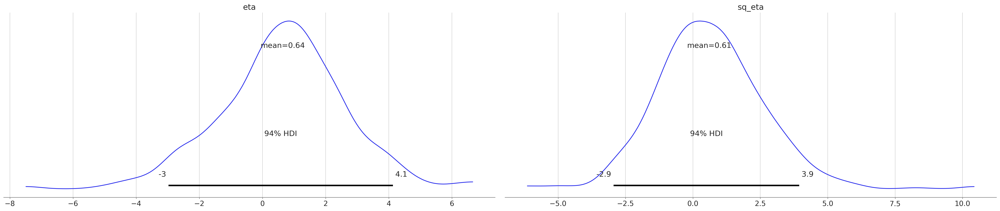

In [39]:
az.plot_posterior({'eta':idata.prior["eta"].isel(obs_id=0),'sq_eta':idata_sq.prior["eta"].isel(obs_id=0)})


In [40]:
if 1==2:
    ax = az.plot_posterior(idata.prior["eta"].isel(obs_id=0))
    for i in range(K - 1):
        ax.axvline(
            idata.prior["cutpoints"].isel(cutpoints_dim_0=i).mean().data,
            color="k",
            lw=2,
            alpha=0.8,
        )

In [41]:
if 1==2:
    implied_probs_prior = az.extract(idata.prior, var_names="goals_scored_probs").rename({"goals_scored_probs_dim_0": "obs_id"}).assign_coords(mindex_coords_original)

In [42]:
if 1==2:
    _, axes = plt.subplots(2, 2, figsize=(14, 8), sharex=True, layout="constrained")
    axes = axes.flatten()
    
    for i, ax in enumerate(axes):
        ax.hist(implied_probs_prior.isel(obs_id=0, event=i), ec="white", bins=20, alpha=0.8)
        ax.set(xlabel="Probability", yticklabels="", title=f"{i} Goals")
        ax.set_yticks([])
        sns.despine()
    plt.suptitle("Prior probability of each event", fontsize=17);

In [43]:
if 1==2:
    implied_class = az.extract(idata.prior_predictive, var_names="goals_scored")

In [44]:
if 1==2:
    ax = (
        implied_class.isel(obs_id=0)
        .to_pandas()
        .reset_index(drop=True)
        .value_counts(normalize=True)
        .sort_index()
        .plot(kind="bar", rot=0, alpha=0.8)
    )
    ax.set(
        xlabel="Goals",
        ylabel="Proportion",
        title="Prior allocation of goals for observation 0",
    );

### Prior predictive checks

In [45]:
if 1==2:
    ax = az.plot_ppc(idata, group="prior", observed=True)
    ax.set(xlabel="Goals scored", title="Prior Predictive Checks");

In [46]:
if 1==2:
    ax = az.plot_ppc(idata_sq, group="prior", observed=True)
    ax.set(xlabel="Goals scored (sq)", title="Prior Predictive Checks (sq)");

In [47]:
if 1==2:
    _, axes = plt.subplots(5, 3, figsize=(12, 14))
    axes = axes.flatten()
    
    for player, (i, ax) in zip(players_ordered, enumerate(axes)):
        idata_plot = idata.copy()
        idata_plot.observed_data = idata.observed_data.sel(name_player=player)
        idata_plot.prior_predictive = idata.prior_predictive.sel(name_player=player)
    
        az.plot_ppc(idata_plot, group="prior", observed=True, ax=ax)
        ax.set(xlabel="Goals scored", yticklabels=[], title=player.title())
        if i > 0:
            ax.get_legend().remove()
            ax.set(xlabel="")
        else:
            ax.legend(ncols=2, fontsize=10, frameon=True)
    
    plt.suptitle("Prior Predictive Checks per player", fontsize=17);

## Sampling and convergence checks

In [48]:
with SFM_rlp:
    idata.extend(pm.sample(nuts_sampler="numpyro", random_seed=rng))
    idata.extend(pm.sample_posterior_predictive(idata, random_seed=rng, compile_kwargs={"mode": "NUMBA"}))

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

/opt/anaconda3/lib/python3.11/site-packages/jax/_src/interpreters/mlir.py:1011: UserWarning: Some donated buffers were not usable: ShapedArray(float64[4,1000,10]), ShapedArray(float64[4,1000,10]), ShapedArray(float64[4,1000,7]), ShapedArray(float64[4,1000,7]), ShapedArray(float64[4,1000,10]), ShapedArray(float64[4,1000,7]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"
2024-08-04 12:28:41.480204: E external/xla/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 1s:

  %reduce.2 = f64[4,1000,108,11]{3,2,1,0} reduce(f64[4,1000,1,108,11]{4,3,2,1,0} %broadcast.44, f64[] %constant.65), dimensions={2}, to_apply=%region_9.242, metadata={op_name="jit(process_fn)/jit(main)/reduce_prod[axes=(2,)]" source_file="/var/folders/wv/ptzsw2sx50dc4_j6b16q80sr0000gn/T/tmp8z8qnnhk" source_line=211}

This isn't necessarily a bug; constant-folding is inherently a trade-off between c

Output()

In [49]:
with SFM_rlp_sq:
    idata_sq.extend(pm.sample(nuts_sampler="numpyro", random_seed=rng))
    idata_sq.extend(pm.sample_posterior_predictive(idata_sq, random_seed=rng, compile_kwargs={"mode": "NUMBA"}))

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

/opt/anaconda3/lib/python3.11/site-packages/jax/_src/interpreters/mlir.py:1011: UserWarning: Some donated buffers were not usable: ShapedArray(float64[4,1000,10]), ShapedArray(float64[4,1000,10]), ShapedArray(float64[4,1000,7]), ShapedArray(float64[4,1000,7]), ShapedArray(float64[4,1000,10]), ShapedArray(float64[4,1000,7]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"
2024-08-04 12:35:20.119599: E external/xla/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 4s:

  %reduce.14 = f64[4,1000,4041]{2,1,0} reduce(f64[4,1000,1,4041]{3,2,1,0} %broadcast.34, f64[] %constant.76), dimensions={2}, to_apply=%region_15.394, metadata={op_name="jit(process_fn)/jit(main)/reduce_prod[axes=(2,)]" source_file="/var/folders/wv/ptzsw2sx50dc4_j6b16q80sr0000gn/T/tmpi95ee7q3" source_line=295}

This isn't necessarily a bug; constant-folding is inherently a trade-off between compila

Output()

In [50]:
idata_sq.sample_stats.diverging.sum().data

array(0)

In [51]:
az.ess(idata_sq).min().to_pandas().sort_values().round()

sq_seasons_Ushape               1280.0
amplitude_rlp                   1530.0
sq_maturity_effect_sq_elite     1548.0
goals_scored_probs              1713.0
diversity                       1892.0
amplitude_elite                 1931.0
maturity_effect_elite_offset    2277.0
f_season_effect_rlp             2396.0
ell_rlp                         2580.0
eta                             2657.0
alpha                           2658.0
baseline_rlp_offset             2743.0
cutpoints                       2783.0
baseline_rlp_mean               2783.0
baseline_elite_mean             2799.0
log_ell_mu_rlp                  3023.0
sq_maturity_effect_sq_rlp       3058.0
f_season_effect_elite           3113.0
baseline_elite_offset           3239.0
log_ell_sd_rlp                  3525.0
ell_elite                       3550.0
maturity_effect_rlp_mean        3775.0
maturity_effect_rlp_offset      3960.0
log_ell_sd_elite                4034.0
basis_coeffs_rlp                4049.0
basis_coeffs_elite       

In [52]:
if 1==2:
    az.summary(
        idata,
        var_names=["cutpoints"],
        filter_vars="regex",
        round_to=2,
    )

In [53]:
# =============================== The Quad-Model: inspect the coefficient on the Quad-Term ========================= #
az.summary(
    idata_sq,
    var_names=["sq_maturity_effect_sq_elite"],
    filter_vars="regex",
    round_to=2,
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sq_maturity_effect_sq_elite[cristiano-ronaldo],0.36,0.21,0.01,0.71,0.01,0.0,1547.95,862.58,1.0
sq_maturity_effect_sq_elite[diego-costa],0.21,0.16,0.00,0.49,0.00,0.0,2969.72,1674.42,1.0
sq_maturity_effect_sq_elite[lionel-messi],0.24,0.17,0.00,0.54,0.00,0.0,2837.85,1971.46,1.0
sq_maturity_effect_sq_elite[michael-owen],0.19,0.14,0.00,0.45,0.00,0.0,4034.21,2556.82,1.0
sq_maturity_effect_sq_elite[nani],0.26,0.17,0.00,0.57,0.00,0.0,3685.15,2563.80,1.0
sq_maturity_effect_sq_elite[neymar],0.19,0.15,0.00,0.46,0.00,0.0,3792.48,2075.61,1.0
sq_maturity_effect_sq_elite[pato],0.19,0.15,0.00,0.46,0.00,0.0,3571.93,2036.67,1.0
sq_maturity_effect_sq_elite[ronaldinho],0.19,0.15,0.00,0.47,0.00,0.0,3583.46,2228.41,1.0
sq_maturity_effect_sq_elite[ronaldo],0.18,0.14,0.00,0.43,0.00,0.0,3480.73,1993.60,1.0
sq_maturity_effect_sq_elite[thierry-henry],0.19,0.14,0.00,0.43,0.00,0.0,3229.62,2021.42,1.0


In [54]:
az.rcParams['plot.max_subplots'] = 50

In [55]:
if 1==2:
    az.plot_trace(
        idata,
        var_names=["~alpha", "~goals_scored_probs", "~eta", "~f_season_", "~basis_coeffs"],
        filter_vars="regex",
    );

## Posterior parameters

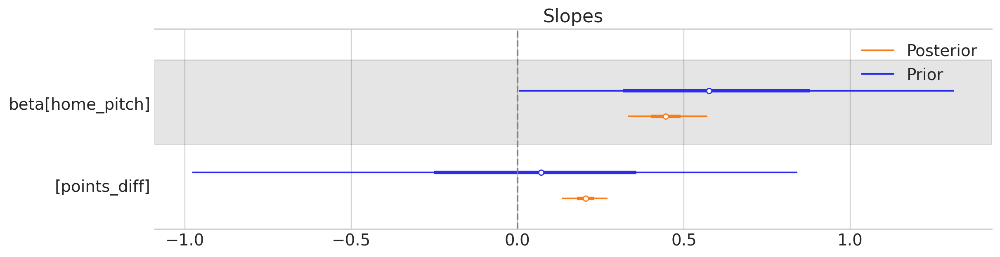

In [56]:
ax = az.plot_forest([idata.prior, idata.posterior], model_names=["Prior", "Posterior"], var_names="beta", combined=True, figsize=(12, 3))
ax[0].axvline(c="grey", ls="--")
ax[0].set(title="Slopes");

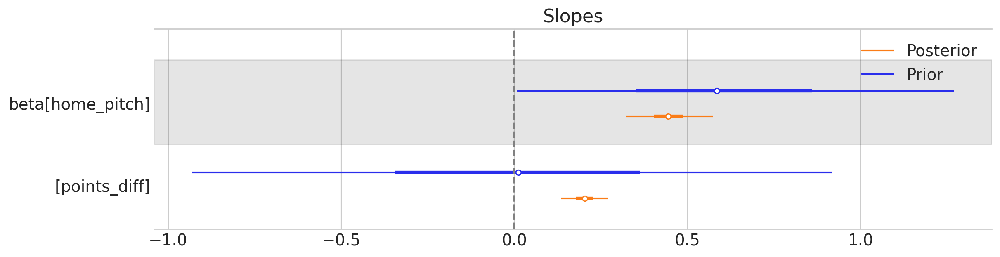

In [57]:
# ================================= The Quad-Model ================================= #

""" Just to check whether there are some weird differences between the baseline model and the Quad-Model. """

ax = az.plot_forest([idata_sq.prior, idata_sq.posterior], model_names=["Prior", "Posterior"], var_names="beta", combined=True, figsize=(12, 3))
ax[0].axvline(c="grey", ls="--")
ax[0].set(title="Slopes");

In [58]:
if 1==2:
    ax = az.plot_forest(
        [idata.prior, idata.posterior],
        model_names=["Prior", "Posterior"],
        var_names=["diversity", "amplitude", "sd_"],
        combined=True,
        filter_vars="regex",
        figsize=(12, 5),
    )
    ax[0].set(title="Standard deviations");

In [59]:
if 1==2:
    ax = az.plot_forest(
        [idata.prior, idata.posterior],
        model_names=["Prior", "Posterior"],
        var_names=["baseline_", "mu_"],
        filter_vars="regex",
        combined=True,
        figsize=(12, 9),
    )
    ax[0].axvline(c="grey", ls="--")
    ax[0].set(title="Baseline effects");

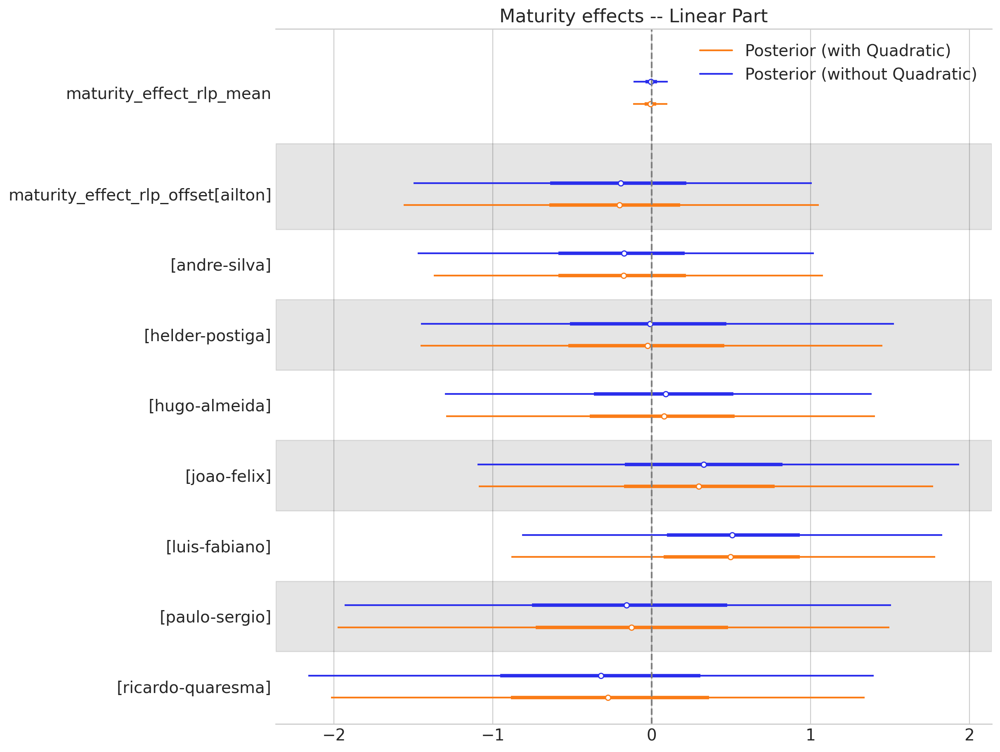

In [60]:
# ================================= Linear Maturity Part: Direct Comparison (RLPs) Baseline vs. Quad ================================= #

ax = az.plot_forest(
    [idata.posterior, idata_sq.posterior],
    model_names=["Posterior (without Quadratic)", "Posterior (with Quadratic)"],
    var_names=["maturity_effect_rlp","sq_maturity_effect_rlp"],
    filter_vars="regex",
    combined=True,
    figsize=(12, 9),
)
ax[0].axvline(c="grey", ls="--")
ax[0].set(title="Maturity effects -- Linear Part");

#ax.ravel()[0].figure.savefig('../20_figures/Maturityeffect_LinearPart_Comparison_RLP.png')

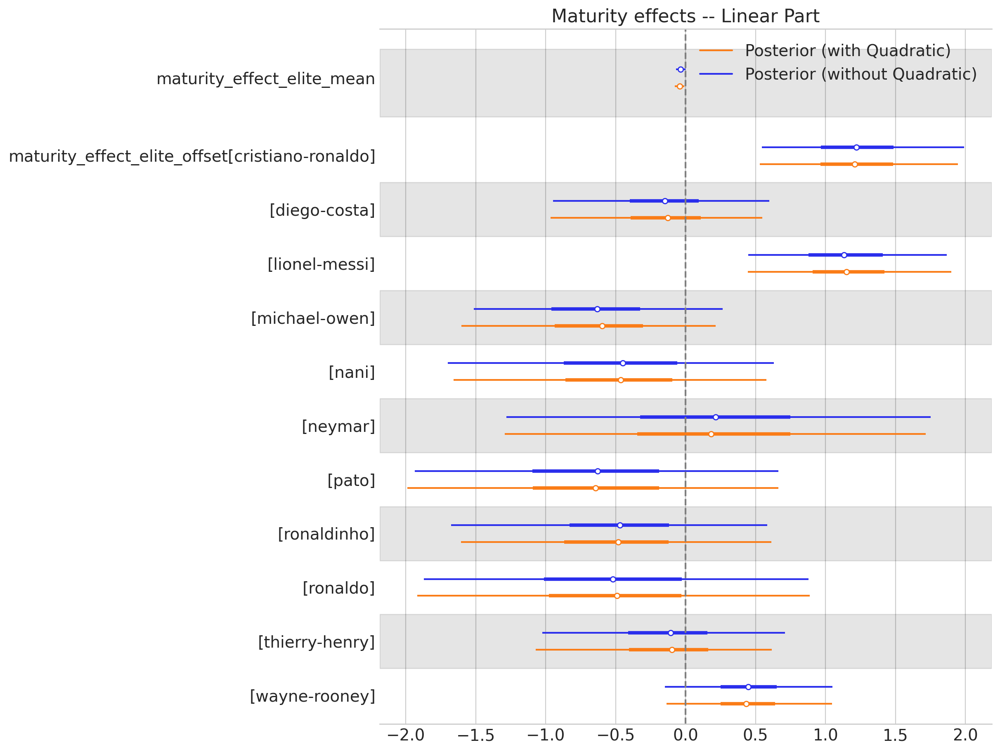

In [61]:
# ================================= Linear Maturity Part: Direct Comparison (EPs) Baseline vs. Quad ================================= #

ax = az.plot_forest(
    [idata.posterior, idata_sq.posterior],
    model_names=["Posterior (without Quadratic)", "Posterior (with Quadratic)"],
    var_names=["maturity_effect_elite","sq_maturity_effect_elite"],
    filter_vars="regex",
    combined=True,
    figsize=(12, 9),
)
ax[0].axvline(c="grey", ls="--")
ax[0].set(title="Maturity effects -- Linear Part");

#ax.ravel()[0].figure.savefig('../20_figures/Maturityeffect_LinearPart_Comparison_Elite.png')

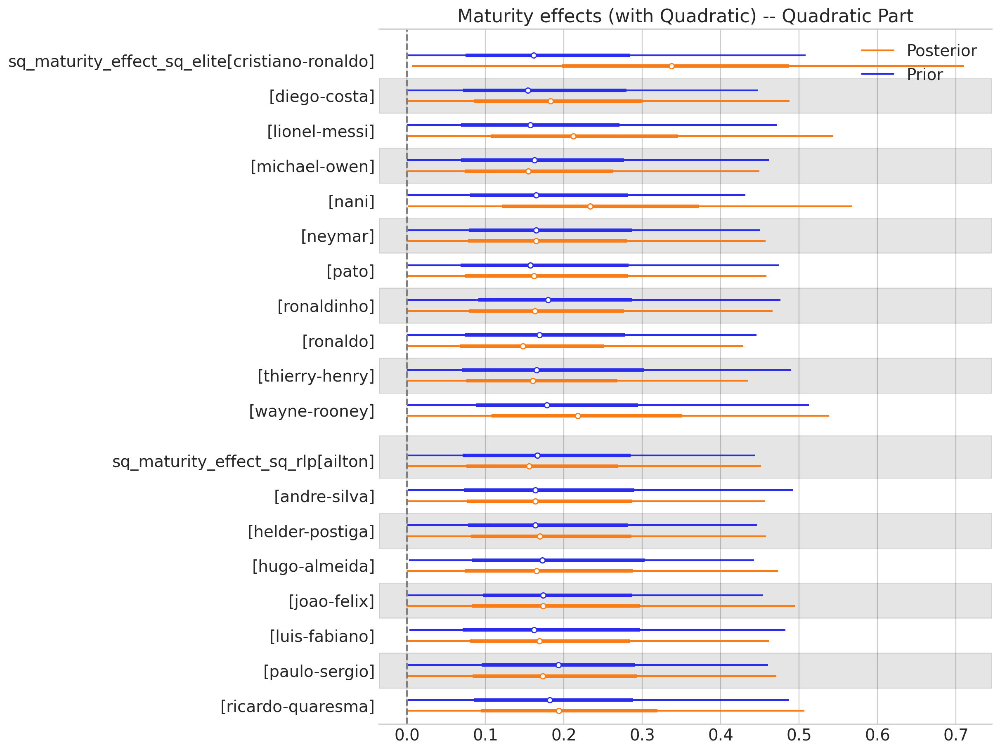

In [62]:
# ================================= Quad-Model: Inspecting the Coefficient on the Quad-Term ================================= #


ax = az.plot_forest(
    [idata_sq.prior, idata_sq.posterior],
    model_names=["Prior", "Posterior"],
    var_names="sq_maturity_effect_sq",
    filter_vars="regex",
    combined=True,
    figsize=(12, 9),
)
ax[0].axvline(c="grey", ls="--")
ax[0].set(title="Maturity effects (with Quadratic) -- Quadratic Part");


#ax.ravel()[0].figure.savefig('../20_figures/Maturityeffect_QuadraticPart.png')

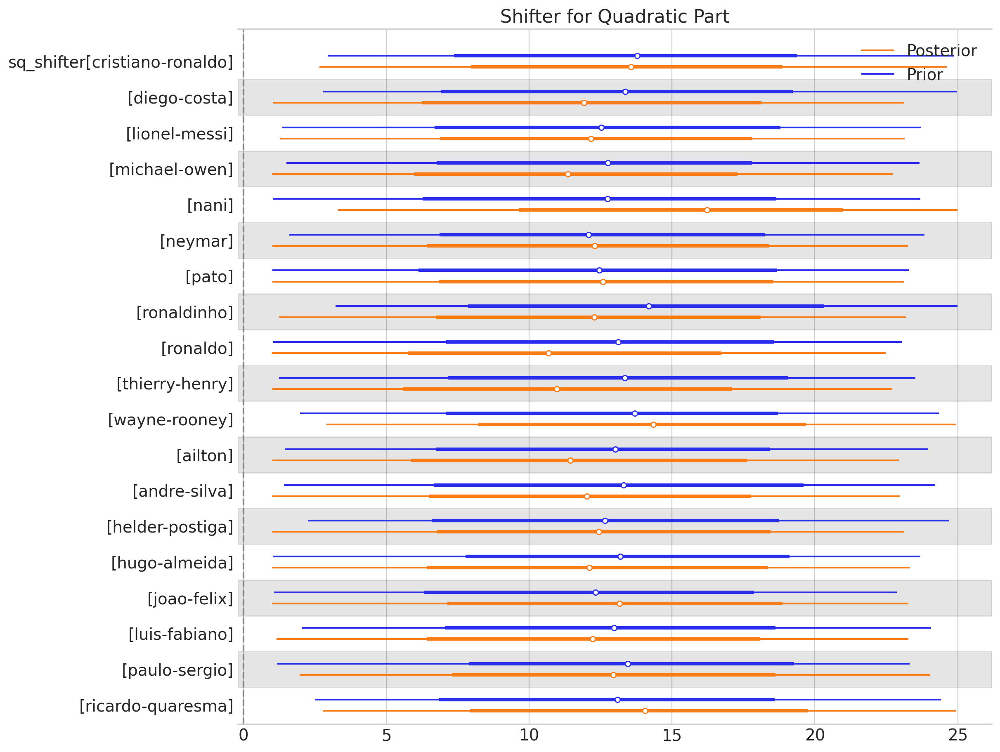

In [63]:
# ================================= Quad-Model: Inspecting the 'Shifter' ================================= #


ax = az.plot_forest(
    [idata_sq.prior, idata_sq.posterior],
    model_names=["Prior", "Posterior"],
    var_names="sq_shifter",
    filter_vars="regex",
    combined=True,
    figsize=(12, 9),
)
ax[0].axvline(c="grey", ls="--")
ax[0].set(title="Shifter for Quadratic Part");


#ax.ravel()[0].figure.savefig('../20_figures/Maturityeffect_QuadraticPart_shifter.png')

In [64]:
# ================================= Maximum Number of Seasons by Player ================================= #


for pp in elite_players:
    print(f'{pp}: {complete_data.loc[complete_data["name_player"] == pp,"season_nbr"].max()}')

cristiano-ronaldo: 19
diego-costa: 12
lionel-messi: 16
michael-owen: 12
nani: 10
neymar: 3
pato: 7
ronaldinho: 7
ronaldo: 5
thierry-henry: 10
wayne-rooney: 15


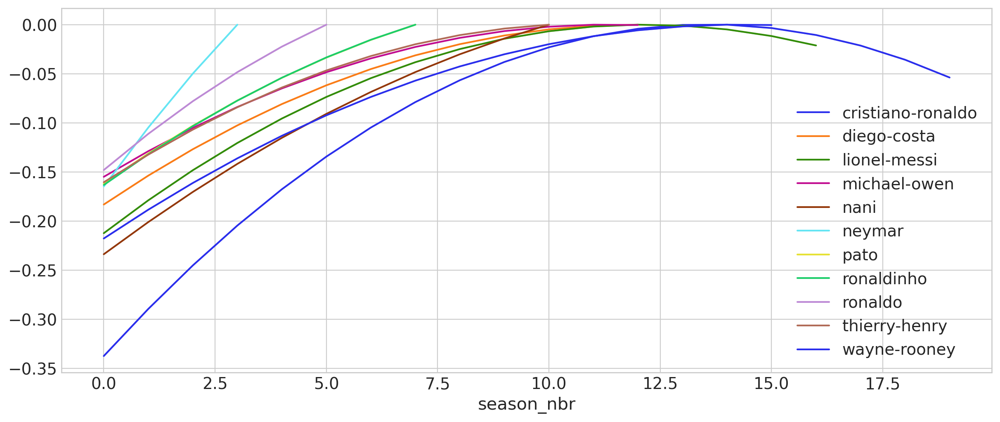

In [65]:
# ================================= Quad-Model ================================= #

""" Plot the effect of the Quad-Term by Player by taking the MEDIAN of the:

    - posterior samples of the coefficient
    - posterior samples of the shifter to 'shift' the number of seasons by player

"""

elite_players = list(idata_sq.posterior['elite'].values)
all_players = list(idata_sq.posterior['player'].values)


def minmax_scaler(series):
    return((series - series.min()) / (series.max() - series.min()))



for pp in elite_players:

    # --- Get the player-index:
    pp_idx = all_players.index(pp)


    # --- Get the season numbers by player:
    season_nbr_CR7 = complete_data.loc[complete_data['name_player'] == pp,'season_nbr']
    

    # --- 'Shifter'
    pp_shifter_median = float(idata_sq.posterior['sq_shifter'][:,:,pp_idx].median().to_numpy())
    season_nbr_shifted = complete_data.loc[complete_data['name_player'] == pp,'season_nbr'].sub(pp_shifter_median)

    # --- Apply the quadratic transform
    maturity_QuadraticTerm = season_nbr_shifted**2
    
    # --- Put into interval [0,1] and take the negative
    maturity_QuadraticTerm = -minmax_scaler(maturity_QuadraticTerm)


    # --- Get themedian coeffcient by player:
    pp_idx = elite_players.index(pp)
    beta_maturity_Quad = float(idata_sq.posterior['sq_maturity_effect_sq_elite'][:,:,pp_idx].median().to_numpy())
    
    
    sns.lineplot(x=season_nbr_CR7,y= maturity_QuadraticTerm*beta_maturity_Quad, label=f'{pp}')
    
plt.ylabel('')
plt.show()    

## Posterior predictive checks

In [ ]:
# ================================= Quad-Model ================================= #

idata_sq.posterior = idata_sq.posterior.rename({"goals_scored_probs_dim_1": "event"})
idata_sq.posterior = idata_sq.posterior.assign_coords(mindex_coords_original)
idata_sq.posterior_predictive = idata_sq.posterior_predictive.assign_coords(mindex_coords_original)

In [ ]:
ax = az.plot_ppc(idata_sq)
ax.set(xlabel="Goals scored", title="Posterior Predictive Checks");

In [ ]:
if 1==2:
    _, axes = plt.subplots(5, 3, figsize=(12, 14))
    axes = axes.flatten()
    
    for player, (i, ax) in zip(players_ordered, enumerate(axes)):
        idata_plot = idata.copy()
        idata_plot.observed_data = idata.observed_data.sel(name_player=player)
        idata_plot.posterior_predictive = idata.posterior_predictive.sel(name_player=player)
    
        az.plot_ppc(idata_plot, ax=ax)
        ax.set(xlabel="Goals scored", yticklabels=[], title=player.title())
        if i > 0:
            ax.get_legend().remove()
            ax.set(xlabel="")
        else:
            ax.legend(fontsize=10, frameon=True)
    
    plt.suptitle("Prior Predictive Checks per player", fontsize=17);

# ALL THE OTHER EVALUATIONS BELOW HAVE NOT YET BEEN ADAPTED FOR THE QUADRATIC MODEL !!!

## Categorical probabilities

In [61]:
implied_probs_post = idata.posterior["goals_scored_probs"].rename({"goals_scored_probs_dim_0": "obs_id"}).assign_coords(mindex_coords_original)

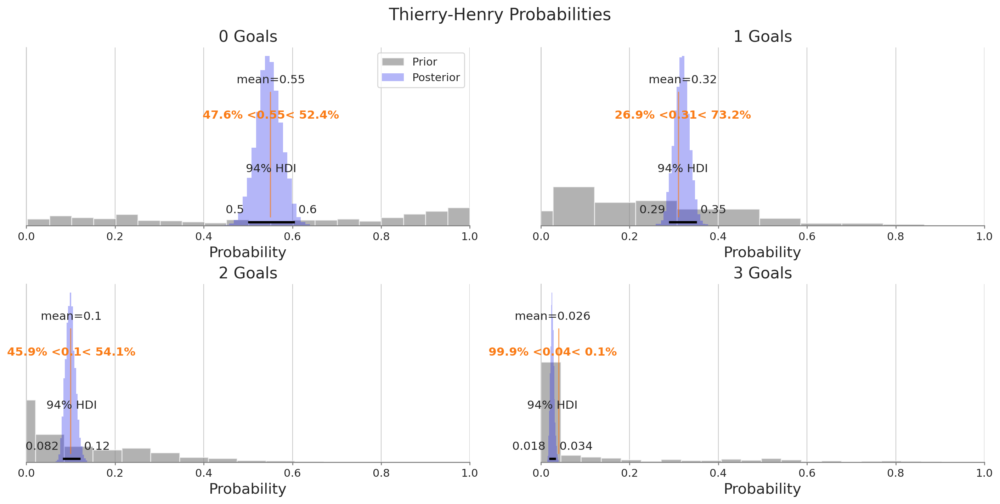

In [62]:
PLAYER = "thierry-henry"
player_probs_prior = implied_probs_prior.sel(name_player=PLAYER)
player_probs_post = implied_probs_post.sel(name_player=PLAYER)
empirics = (
    idata.observed_data.sel(name_player=PLAYER)["goals_scored"]
    .to_pandas()
    .value_counts(normalize=True)
)

_, axes = plt.subplots(2, 2, figsize=(14, 7), layout="constrained")
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.hist(
        player_probs_prior.sel(event=i).mean("obs_id"),
        color="grey",
        ec="white",
        bins=20,
        alpha=0.6,
        label="Prior",
    )
    az.plot_posterior(
        player_probs_post.sel(event=i).mean("obs_id"),
        label="Posterior",
        ax=ax,
        ref_val=empirics[i].round(2),
        textsize=11,
        kind="hist",
        bins=20,
    )
    ax.set(xlabel="Probability", yticklabels="", title=f"{i} Goals", xlim=[0, 1])
    ax.set_yticks([])
    sns.despine()
    if i == 0:
        ax.legend(fontsize=11, frameon=True)
plt.suptitle(f"{PLAYER.title()} Probabilities", fontsize=17);

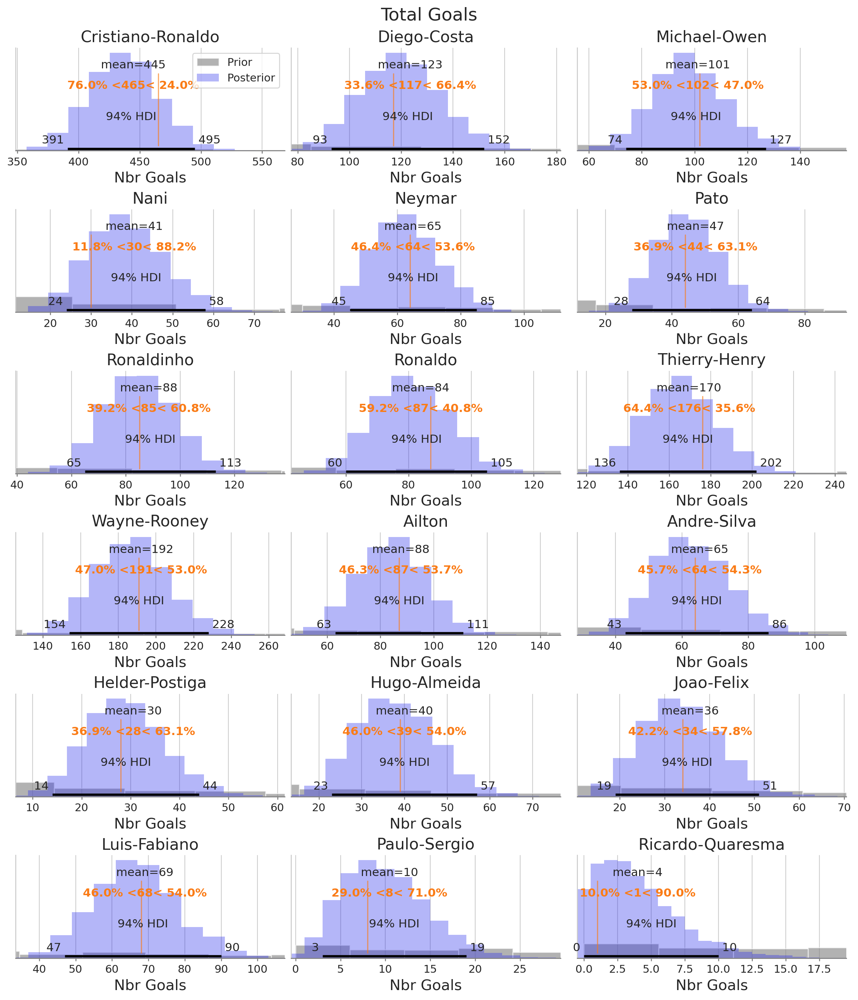

In [63]:
_, axes = plt.subplots(6, 3, figsize=(12, 14), layout="constrained")
axes = axes.flatten()

for player, (i, ax) in zip(players_ordered, enumerate(axes)):
    goals_prior = (
        az.extract(idata.prior_predictive, var_names="goals_scored")
        .sel(name_player=player)
        .sum("obs_id")
    )
    goals_post = (
        idata.posterior_predictive["goals_scored"].sel(name_player=player).sum("obs_id")
    )
    empirics = (
        idata.observed_data.sel(name_player=player)["goals_scored"].to_pandas().sum()
    )

    ax.hist(goals_prior, color="grey", ec="white", bins=20, alpha=0.6, label="Prior")
    az.plot_posterior(
        goals_post, label="Posterior", ax=ax, ref_val=empirics, textsize=11
    )
    ax.set(xlabel="Nbr Goals", yticklabels="", title=f"{player.title()}")
    ax.set_yticks([])
    sns.despine()
    if i == 0:
        ax.legend(fontsize=11, frameon=True)
plt.suptitle("Total Goals", fontsize=18);

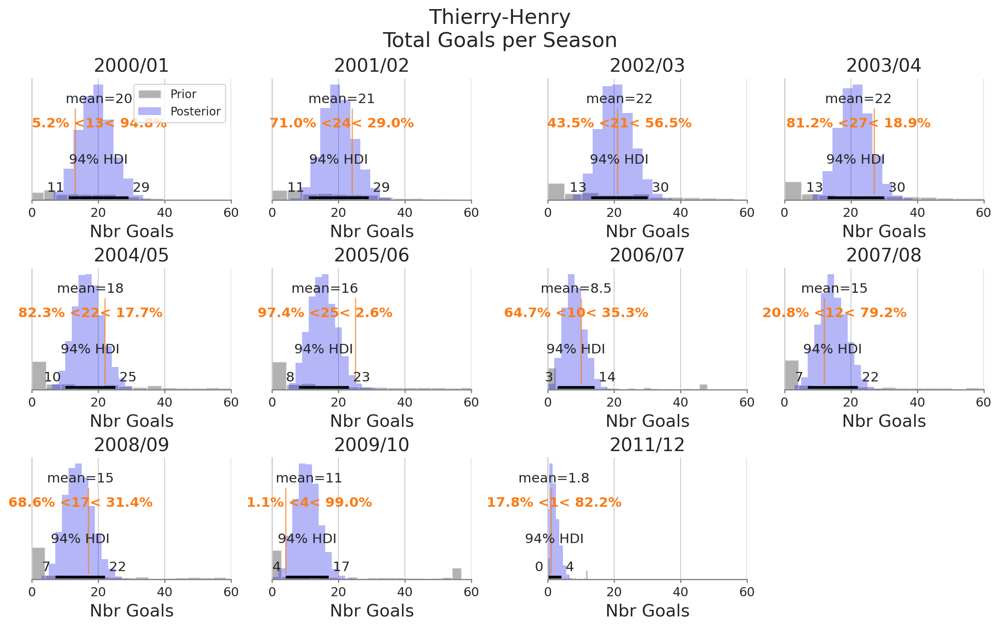

In [64]:
goals_prior = (
    az.extract(idata.prior_predictive, var_names="goals_scored")
    .sel(name_player=PLAYER)
    .groupby("season")
    .sum("obs_id")
)
goals_post = (
    idata.posterior_predictive["goals_scored"]
    .sel(name_player=PLAYER)
    .groupby("season")
    .sum("obs_id")
)
empirics = (
    idata.observed_data.sel(name_player=PLAYER)["goals_scored"]
    .to_pandas()
    .reset_index(name="goals")
    .groupby("season")
    .sum()["goals"]
)

unique_seasons = np.unique(goals_prior.season)
num_seasons = len(unique_seasons)

cols = 4
rows = (num_seasons + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(12, 2.5 * rows), layout="constrained")
axes = axes.flatten()

for season, (i, ax) in zip(unique_seasons, enumerate(axes)):
    ax.hist(
        goals_prior.sel(season=season),
        color="grey",
        ec="white",
        bins=20,
        alpha=0.6,
        label="Prior",
    )
    az.plot_posterior(
        goals_post.sel(season=season),
        label="Posterior",
        ax=ax,
        ref_val=empirics[season],
        textsize=11,
    )
    ax.set(xlabel="Nbr Goals", yticklabels="", title=f"{season}", xlim=[0, 60])
    ax.set_yticks([])
    sns.despine()
    if i == 0:
        ax.legend(fontsize=10, frameon=True)

# remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle(f"{PLAYER.title()}\nTotal Goals per Season", fontsize=18);

## Excess-Skill Metric

Therefore, let's have alook at the **excess-skill-metric** $S_{i,s}$. It compares each player's probability of scoring ($\hat{p}_{i,s}$) when accounting for both his ability and his team's strength ($\hat{\alpha}_{i,s} + \mathbf{X}_{i,s} \, \hat{\beta}$) to the probability of him scoring when only accounting for his own skill/ability ($\hat{\alpha}_{i,s}$):

 $$ S_{i,s} = \frac{\frac{e^{\hat{\alpha}_{i,s}}}{1 \; + \; e^{\hat{\alpha}_{i,s}}}}{\frac{e^{\hat{\alpha}_{i,s} + \mathbf{X}_{i,s} \, \hat{\beta}}}{1 \; + \; e^{\hat{\alpha}_{i,s} + \mathbf{X}_{i,s} \, \hat{\beta}}}} \quad ,$$

where $S_{i,s} > 1$ tells us that -- according to the model -- **the player's scoring probability was dragged down by his team's performance**. Said differently, **player $i$'s full potential did not come through** while playing for that particular team in season $s$.


<br>

Since we already have stored the estimates for the numerator in `Player_Skill_season`, the only thing that is left to compute $S_{i,s}$ is the denominator.

To estimate the full model ( $\hat{\alpha}_{i,s} + \mathbf{X}_{i,s} \, \hat{\beta}$ ), we could again draw all our parameter-samples from the posterior via `trace_multi.posterior` and simulate some predictions ($\hat{p}_{i,s}$) using our observed factors $\mathbf{X}_{i,s}$. But that sounds like a lot of manual work ...

<br>

... **but with [#PyMC](https://www.pymc.io/welcome.html) it's pretty easy!** The `trace_multi.posterior["p_score"]` array has already got everything what we are looking for, namely the denominator in $S_{i,s}$.

<br>

Awesome! Let's compute our $S_{i,s}$ statistic as described above:

In [ ]:
with SFM_rlp:
    pm.set_data(
        {
            "factor_data": np.zeros(idata.constant_data.factor_data.shape)
        },  # all teams are equal
    )

In [ ]:
with SFM_rlp:
    perf_alone = pm.sample_posterior_predictive(
        idata,
        var_names=["goals_scored_probs"],
        compile_kwargs={"mode": "NUMBA"},
    )

In [ ]:
perf_alone.posterior_predictive = perf_alone.posterior_predictive.rename(
    {"goals_scored_probs_dim_3": "event"}
)
perf_alone.posterior_predictive = perf_alone.posterior_predictive.assign_coords(
    mindex_coords
)

In [ ]:
prob_alone = 1 - perf_alone.posterior_predictive["goals_scored_probs"].sel(event=0)
prob_with_team = 1 - idata.posterior["goals_scored_probs"].sel(event=0)
s_metric = prob_alone / prob_with_team

<br>

So let's plot $S_{i,s}$, i.e. player $i$'s *excess-skill* in season $s$!

<br>

> Recall: $\,$ if $S_{i,s} > 1$ -- accordng to the model -- the player is *under-valued* compared to his inherent skill/ability, <br> &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&ensp; i.e. the player actually has **excess skill** but his own team is dragging him down.

In [ ]:
filtered_seasons = complete_data.groupby("season")["name_player"].nunique().ge(3)
seasons_with_at_least_three_players = filtered_seasons[filtered_seasons].index

In [ ]:
_, axes = plt.subplots(6, 2, figsize=(14, 20), layout="constrained")
axes = axes.ravel()

for ax, season in zip(axes, seasons_with_at_least_three_players):
    s_per_season = (
        s_metric.sel(season=season)
        .groupby("name_player")
        .mean("obs_id")
        .rename("Excess Skill")
    )
    az.plot_forest(s_per_season, combined=True, ax=ax, colors="#AAC4E6")
    ax.set_title(season)
    ax.axvline(x=1, color="#70133A", alpha=0.6, ls="--", lw=2)

plt.suptitle("Has a Player been Undervalued? \n $S_{i} > 1$", fontsize=20);

<br>

But it could also be interesting to look **across seasons**! <br>
Let's just apply a summary metric (naturally the *mean* or *median*) on $S_{i,s}$ (where $S_{i,s}$ itself is either the *mean* or *median* of samples from the posterior distribution) across $s$, and get $S_{i}$, i.e. player $i$'s *excess-skill* across all seasons $s$.

In [ ]:
s_across_seasons = s_metric.groupby("name_player").mean("obs_id").rename("Excess Skill")

In [ ]:
ax = az.plot_forest(s_across_seasons, combined=True, colors="#AAC4E6")
ax[0].set_title("Has a Player been Undervalued? \n $S_{i} > 1$")
ax[0].axvline(x=1, color="#70133A", alpha=0.6, ls="--", lw=2);

To recap again: the purpose of $S_{i}$ or $S_{i,s}$ is to evaluate how a  player's probability of scoring only based on his skill/ability, $\; P\left(Y_{i,s} | \hat{\alpha}_i \right) \;$, compares to the probability of him scoring when we also account for his team's strength, $\; P\left(Y_{i,s} | \mathbf{X}_{i,s}\, , \hat{\alpha}_i \, , \hat{\beta} \right) \;$. <br>
Keep in mind that we have built these metrics based on the posterior distribution's *median* (or the *mean*) -- hence, a single point-estimate only. We haven't said anything about the uncertainty around that single number.

## Performance evolution through time

### Gaussian Process on day-of-season

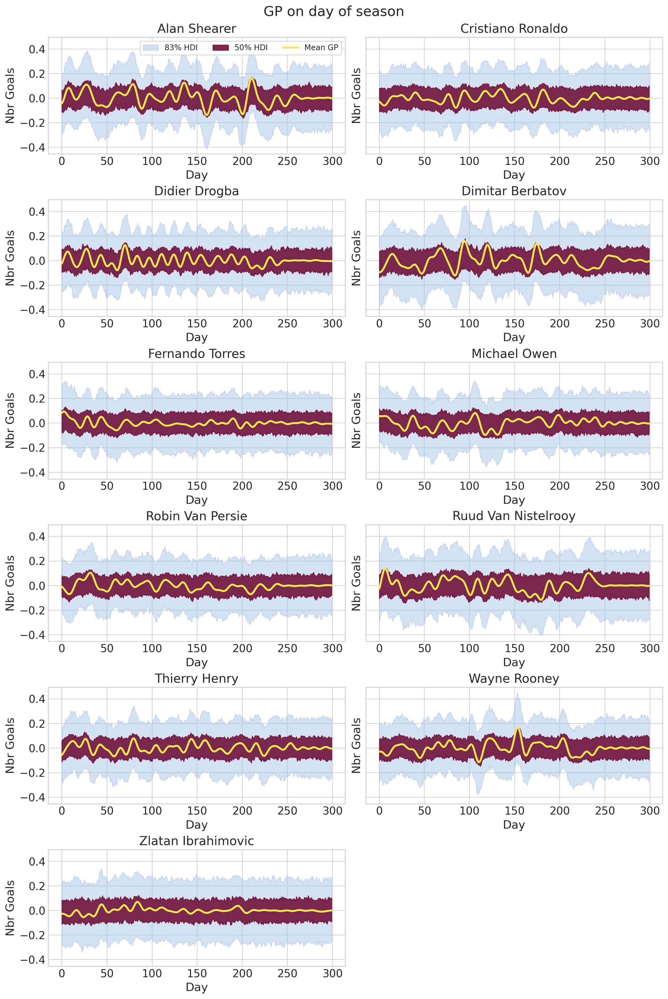

In [85]:
f_post = idata.posterior["f_season_effect_elite"]

_, axes = plt.subplots(6, 2, figsize=(12, 18), sharey=True, layout="constrained")
axes = axes.flatten()
axes[-1].remove()

for player, (i, ax) in zip(f_post.elite.to_numpy(), enumerate(axes)):
    dates = f_post.sel(elite=player)["day"]
    y_plot = f_post.sel(elite=player)
    az.plot_hdi(
        x=dates,
        y=y_plot,
        hdi_prob=0.83,
        color="#AAC4E6",
        fill_kwargs={"alpha": 0.5, "label": r"$83\%$ HDI"},
        ax=ax,
        smooth=False,
    )
    az.plot_hdi(
        x=dates,
        y=y_plot,
        hdi_prob=0.5,
        color="#70133A",
        fill_kwargs={"alpha": 0.9, "label": r"$50\%$ HDI"},
        ax=ax,
        smooth=False,
    )
    ax.plot(
        dates, y_plot.mean(("chain", "draw")), color="#FBE64D", lw=2.5, label="Mean GP"
    )
    ax.set(xlabel="Day", ylabel="Nbr Goals", title=f"{player.title()}")
    if i == 0:
        ax.legend(fontsize=10, frameon=True, ncols=3)
plt.suptitle("GP on day of season", fontsize=18);

### Goal Probabilities per Season

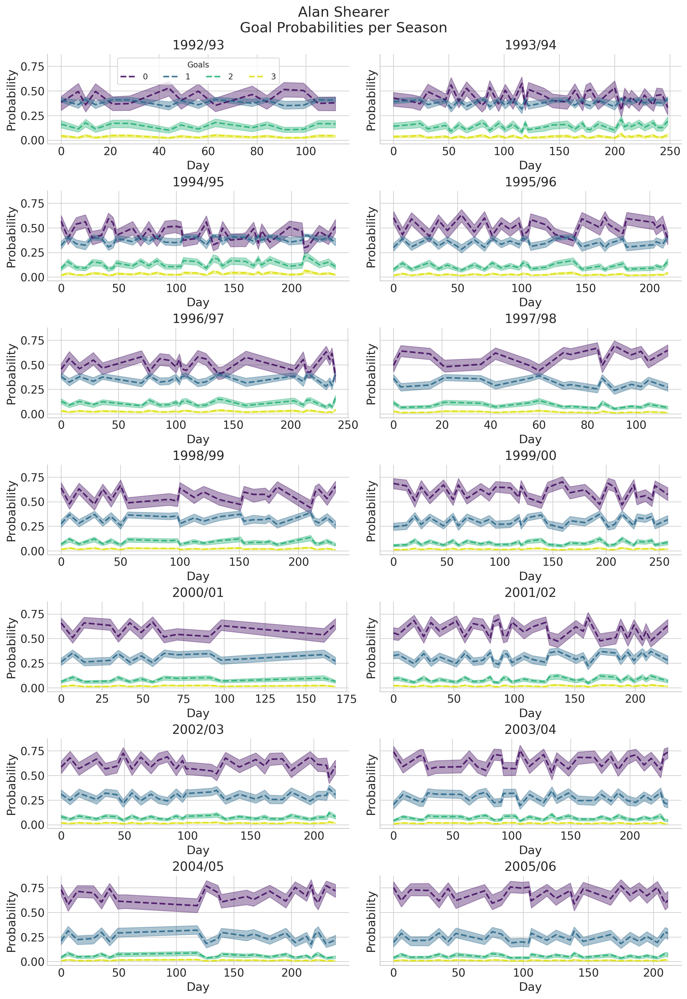

In [144]:
PLAYER = "alan shearer"
player_probs_post = implied_probs_post.sel(name_player=PLAYER)
colors = plt.cm.viridis(np.linspace(0.05, 0.95, len(coords["event"])))

cols = 2
rows = (num_seasons + cols - 1) // cols

fig, axes = plt.subplots(
    rows, cols, figsize=(12, 2.5 * rows), layout="constrained", sharey=True
)
axes = axes.flatten()

for season, (i, ax) in zip(unique_seasons, enumerate(axes)):
    dates = player_probs_post.sel(season=season)["days_since_first_game"]
    y_plot = player_probs_post.sel(season=season)

    for event in player_probs_post.event.to_numpy():
        az.plot_hdi(
            x=dates,
            y=y_plot.sel(event=event),
            hdi_prob=0.75,
            color=colors[event],
            fill_kwargs={"alpha": 0.4},
            ax=ax,
            smooth=False,
        )
        ax.plot(
            dates,
            y_plot.sel(event=event).mean(("chain", "draw")),
            lw=2,
            ls="--",
            label=f"{event}",
            color=colors[event],
            alpha=0.9,
        )

    ax.set(xlabel="Day", ylabel="Probability", title=f"{season}")
    sns.despine()
    if i == 0:
        ax.legend(fontsize=10, frameon=True, title="Goals", ncols=4)

# remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle(f"{PLAYER.title()}\nGoal Probabilities per Season", fontsize=18);

## Counterfactuals

### What if all teams were equal?

In [146]:
unique_seasons = np.arange(complete_data["season_nbr"].max() + 1)

index = pd.MultiIndex.from_product(
    [players_ordered, unique_seasons, unique_gamedays],
    names=["player", "season_nbr", "gameday"],
)
unique_combinations = pd.DataFrame(index=index).reset_index()
unique_combinations

,player,season_nbr,gameday
0,cristiano-ronaldo,0,1
1,cristiano-ronaldo,0,2
2,cristiano-ronaldo,0,3
3,cristiano-ronaldo,0,4
4,cristiano-ronaldo,0,5
...,...,...,...
14435,ricardo-quaresma,19,34
14436,ricardo-quaresma,19,35
14437,ricardo-quaresma,19,36
14438,ricardo-quaresma,19,37


In [152]:
with SFM_rlp:
    pm.set_data(
        coords={"obs_id": unique_combinations.index},
        new_data={
            "seasons": unique_combinations["season_nbr"].to_numpy(),
            "seasons_Ushape": -((unique_combinations['season_nbr'].sub(unique_combinations.groupby('player')['season_nbr'].transform('mean'))*0.1)**2),

            "gameday_id": pd.Categorical(unique_combinations["gameday"], categories=unique_gamedays).codes,
            "player_id": pd.Categorical(
                unique_combinations["player"], categories=players_ordered
            ).codes,
            "factor_data": np.zeros(
                (len(unique_combinations), len(factors))
            ),  # all teams are equal
            "goals_obs": np.zeros(
                len(unique_combinations), dtype=int
            ),  # just a placeholder for shape inference
        },
    )

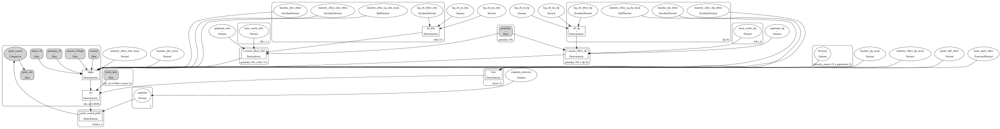

In [153]:
pm.model_to_graphviz(SFM_rlp)

In [154]:
with SFM_rlp:
    counterfact_preds = pm.sample_posterior_predictive(
        idata,
        var_names=["alpha", "goals_scored_probs", "goals_scored"],
        predictions=True,
        compile_kwargs={"mode": "NUMBA"},
    )

/opt/anaconda3/lib/python3.11/site-packages/pytensor/link/numba/dispatch/basic.py:377: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
Sampling: [goals_scored]


Output()

In [155]:
counterfact_preds.predictions = counterfact_preds.predictions.rename({"goals_scored_probs_dim_3": "event"})

# declare the Multiindex as coordinates
mindex_coords = xr.Coordinates.from_pandas_multiindex(index, "obs_id")

# pass it as coordinates
counterfact_preds.predictions = counterfact_preds.predictions.assign_coords(mindex_coords)
counterfact_preds.predictions_constant_data = counterfact_preds.predictions_constant_data.assign_coords(
    mindex_coords
)
counterfact_preds.predictions

<xarray.Dataset> Size: 3GB
Dimensions:                   (chain: 4, draw: 1000, obs_id: 14440,
                               goals_scored_probs_dim_2: 14440, event: 4)
Coordinates:
  * chain                     (chain) int64 32B 0 1 2 3
  * draw                      (draw) int64 8kB 0 1 2 3 4 ... 995 996 997 998 999
  * goals_scored_probs_dim_2  (goals_scored_probs_dim_2) int64 116kB 0 ... 14439
  * event                     (event) int64 32B 0 1 2 3
  * obs_id                    (obs_id) object 116kB MultiIndex
  * player                    (obs_id) object 116kB 'cristiano-ronaldo' ... '...
  * season_nbr                (obs_id) int64 116kB 0 0 0 0 0 ... 19 19 19 19 19
  * gameday                   (obs_id) int64 116kB 1 2 3 4 5 ... 34 35 36 37 38
Data variables:
    alpha                     (chain, draw, obs_id) float64 462MB 0.6887 ... ...
    goals_scored              (chain, draw, obs_id) int64 462MB 0 0 0 ... 0 0 0
    goals_scored_probs        (chain, draw, goals_scored_probs_dim_2, event) float64 2GB ...
Attributes:
    created_at:                 2024-07-31T16:18:53.621451+00:00
    arviz_version:              0.18.0
    inference_library:          pymc
    inference_library_version:  5.16.2

#### Scoring Probabilities

In [156]:
implied_probs_preds = counterfact_preds.predictions["goals_scored_probs"].rename({"goals_scored_probs_dim_2": "obs_id"}).assign_coords(mindex_coords)

In [157]:
n_seasons = complete_data.groupby(["name_player"])["season"].nunique().sort_values()
probs_preds = az.extract(implied_probs_preds, var_names="goals_scored_probs")
dates = np.unique(probs_preds["season_nbr"].to_numpy())
player_data = (
    complete_data.groupby(["name_player", "season_nbr"])["goal"]
    .value_counts(normalize=True)
    .sort_index()
    .reset_index(level=[1, 2])
)
player_data = player_data[player_data.goal == 1].drop("goal", axis=1)

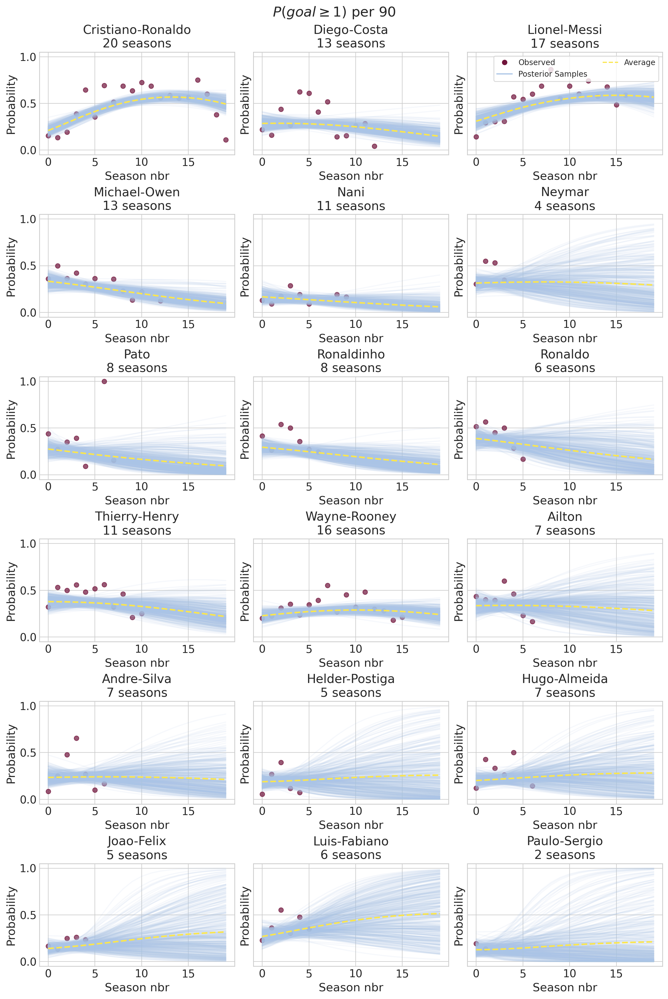

In [158]:
_, axes = plt.subplots(6, 3, figsize=(12, 18), sharey=True, layout="constrained")
axes = axes.flatten()

for player, (i, ax) in zip(players_ordered, enumerate(axes)):
    player_scoring_prob = 1 - probs_preds.sel(player=player, event=0).groupby(
        "season_nbr"
    ).mean("obs_id")

    ax.plot(
        dates,
        player_scoring_prob.sel(sample=slice(None, None, 10)),
        color="#AAC4E6",
        alpha=0.1,
    )
    ax.plot(dates, player_scoring_prob.mean("sample"), color="#FBE64D", lw=2, ls="--")
    ax.scatter(
        player_data.loc[player, "season_nbr"],
        player_data.loc[player, "proportion"],
        color="#70133A",
        alpha=0.7,
    )

    ax.set(
        title=f"{player.title()}\n{n_seasons.loc[player]} seasons",
        xlabel="Season nbr",
        ylabel="Probability",
    )
    if i == 2:
        handles = [
            Line2D(
                [], [], color="#70133A", marker="o", linestyle="None", label="Observed"
            ),
            Line2D([], [], color="#AAC4E6", label="Posterior Samples"),
            Line2D([], [], color="#FBE64D", ls="--", label="Average"),
        ]
        ax.legend(handles=handles, fontsize=10, frameon=True, ncols=2)

plt.suptitle("$P(goal \\geq 1)$ per 90", fontsize=18);

#### Scoring Rates

Compute expected goals per match for each posterior sample (assuming 3+ goals is treated as exactly 3 goals).

In [159]:
expected_goals = (
    (
        1 * implied_probs_preds.sel(event=1)
        + 2 * implied_probs_preds.sel(event=2)
        + 3 * implied_probs_preds.sel(event=3)
    )
    .unstack("obs_id")
    .rename("expected_goals")
)
player_data = complete_data.set_index("name_player")

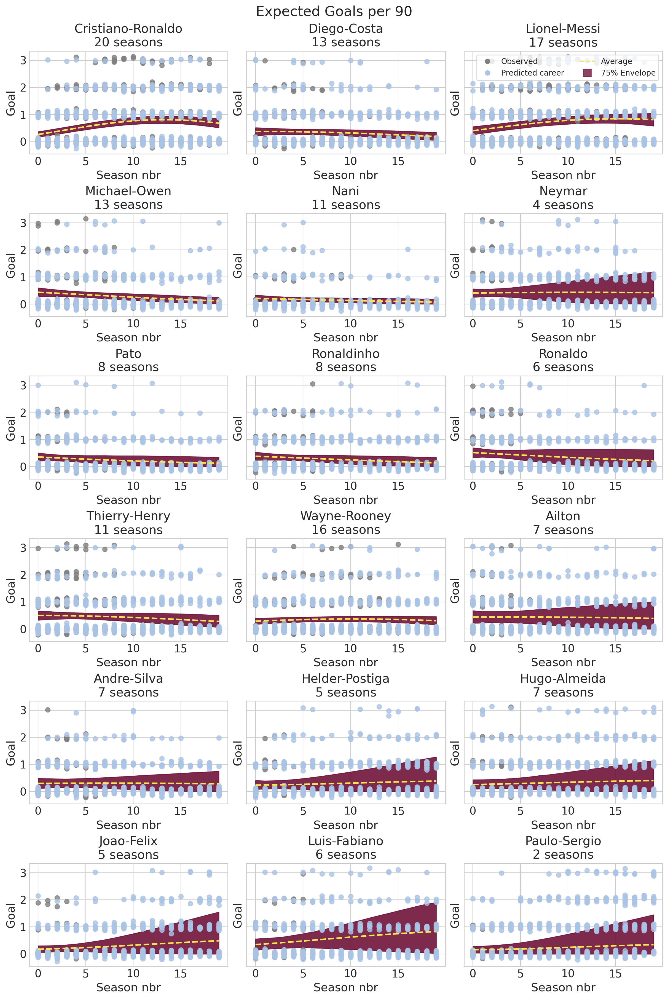

In [160]:
_, axes = plt.subplots(6, 3, figsize=(12, 18), sharey=True, layout="constrained")
axes = axes.flatten()
jitter_strength = 0.07

for player, (i, ax) in zip(players_ordered, enumerate(axes)):
    player_scoring_rate = expected_goals.sel(player=player)
    player_preds = az.extract(counterfact_preds.predictions.sel(player=player))["goals_scored"].sel(
        sample=(
            rng.choice(counterfact_preds.predictions.chain),
            rng.choice(counterfact_preds.predictions.draw),
        ),
    )

    ax.plot(
        player_preds["season_nbr"],
        player_preds + rng.normal(0, jitter_strength, player_preds.shape),
        marker="o",
        linestyle="None",
        color="#AAC4E6",
        alpha=0.8,
    )
    az.plot_hdi(
        dates,
        hdi_data=az.hdi(
            player_scoring_rate, input_core_dims=[["chain", "draw", "gameday"]]
        ),
        hdi_prob=0.75,
        ax=ax,
        smooth=False,
        color="#70133A",
        fill_kwargs={"alpha": 0.9},
    )
    ax.plot(
        dates,
        player_scoring_rate.mean(["chain", "draw", "gameday"]),
        color="#FBE64D",
        lw=2,
        ls="--",
    )
    ax.scatter(
        player_data.loc[player, "season_nbr"],
        player_data.loc[player, "goals_cats"]
        + rng.normal(0, jitter_strength, len(player_data.loc[player, "goals_cats"])),
        c="grey",
        alpha=0.8,
    )

    ax.set(
        title=f"{player.title()}\n{n_seasons.loc[player]} seasons",
        xlabel="Season nbr",
        ylabel="Goal",
    )
    if i == 2:
        handles = [
            Line2D(
                [], [], color="grey", marker="o", linestyle="None", label="Observed"
            ),
            Line2D(
                [],
                [],
                color="#AAC4E6",
                marker="o",
                linestyle="None",
                label="Predicted career",
            ),
            Line2D([], [], color="#FBE64D", ls="--", label="Average"),
            Line2D(
                [],
                [],
                color="#70133A",
                alpha=0.8,
                marker="s",
                markersize=10,
                linestyle="None",
                label="75% Envelope",
            ),
        ]
        ax.legend(handles=handles, fontsize=10, frameon=True, ncols=2)

plt.suptitle("Expected Goals per 90", fontsize=18);

### Alternate trades scenarios

1. A constant question decision-makers have is: __What would this player's performance be if we hired him in our team?__ I think we can already do that: for a given player (the one we're interested in), replace the factor data he's originally linked to by the factor data of his new potential team; then sample posterior predictive performance, and boom! Do you agree we can already do that?

2. In the same vein, __counterfactual study__: Let's take this transfer from player A to team X (that actually happened), make model predictions and compare to the observed performance of the player in team X. Then, simulate he was instead transferred to team Y, and see how his performance changes (i.e __what if he had been traded to that other team instead?__).

--> [interrupted time series](https://www.pymc.io/projects/examples/en/latest/causal_inference/interrupted_time_series.html)

- SCORES MORE GOALS THAN TOTAL TEAM OBSERVED PER GAME? --> NEED UPPER BOUND ON PLAYER EQUAL TO TOTAL OF TEAM

In [102]:
data_by_team = pd.read_csv("../../10_data/101_SFM/SFM_data_byTeam.csv")

In [104]:
# nbr goals scored in game N
data_by_team.groupby(["name_team", "season"])["goalsscored_cum_team"].diff()

0        NaN
1        4.0
2        0.0
3        3.0
4        1.0
        ... 
68885    1.0
68886    2.0
68887    0.0
68888    1.0
68889    2.0
Name: goalsscored_cum_team, Length: 68890, dtype: float64

### Define class

In [309]:
class CounterfactualsFactory:
    def __init__(self, complete_data: pd.DataFrame, data_by_team: pd.DataFrame, factors: list, scaler: StandardScaler):
        self.complete_data = complete_data
        self.data_by_team = data_by_team
        self.factors = factors
        self.scaler = scaler

    def isolate_player(self, player_name: str) -> pd.DataFrame:
        """
        Isolate data for a specific player.

        Parameters:
        -----------
        player_name : str
            The name of the player to isolate for the counterfactuals.

        Returns:
        --------
        pd.DataFrame
            A DataFrame containing data for the specified player with the 'kickoff_dt' normalized.
        """
        self.player_name = player_name
        player_data = self.complete_data[self.complete_data["name_player"] == player_name]
        player_data["kick_off"] = player_data["kick_off"].dt.normalize()
        
        self.player_data = player_data[
            ["name_player", "name_team", "name_league", "season", "season_nbr", "kick_off", "gameday", "goals_cats"] + self.factors
        ].reset_index(drop=True)

        return self.player_data

    def select_team_seasons(self, team_name: str, start_season: str, end_season: str) -> pd.DataFrame:
        """
        Select data for a specific team and seasons, normalize date and standardize factors.

        Parameters:
        -----------
        team_name : str
            The name of the team to select.
        start_season : str
            The start season in the format 'YYYY/YY'. Included in selection.
        end_season : str
            The end season in the format 'YYYY/YY'. Included in selection.

        Returns:
        --------
        pd.DataFrame
            A DataFrame containing data for the specified team and seasons with normalized dates and standardized factors.
        """
        team_data = self.data_by_team.loc[
            (self.data_by_team["name_team"] == team_name) &
            (self.data_by_team["season"] >= start_season) &
            (self.data_by_team["season"] <= end_season)
        ]
        team_data["kick_off"] = pd.to_datetime(team_data["kick_off"], yearfirst=True).dt.normalize()
        
        max_season_nbr = self.player_data.loc[self.player_data["season"] == start_season, "season_nbr"].iloc[-1]
        team_data["season_nbr"] = team_data["season"].factorize(sort=True)[0] + max_season_nbr
        
        team_data["gameday"] = team_data.groupby("season").rank(method="first")["kick_off"].astype(int)
        
        selected_columns = ["name_team", "name_league", "season", "season_nbr", "kick_off", "gameday"] + self.factors
        team_data = team_data[selected_columns].reset_index(drop=True)
        
        # Standardize factors using the fitted scaler
        team_data[factors_numeric] = self.scaler.transform(team_data[factors_numeric])
        
        return team_data

    def _setup_pymc_data(self, team_data: pd.DataFrame, model: pm.Model, players_ordered: pd.Index, unique_gamedays: List):
        """
        Set up PyMC data for counterfactual analysis.

        Parameters:
        -----------
        team_data : pd.DataFrame
            The team data for the counterfactual analysis.
        model : pm.Model
            The PyMC model.
        players_ordered : pd.Index
            The ordered list of player names, defined at beginning of notebook.
        unique_gamedays : list
            The list of game days, defined at beginning of notebook.
        """
        with model:
            pm.set_data(
                coords={"obs_id": team_data.index},
                new_data={
                    "seasons": team_data["season_nbr"].to_numpy(),
                    "gameday_id": pd.Categorical(team_data["gameday"], categories=unique_gamedays).codes,
                    "player_id": np.full_like(team_data["season_nbr"], fill_value=players_ordered.get_loc(self.player_name)),
                    "factor_data": team_data[self.factors].to_numpy(),
                    "goals_obs": np.zeros(len(team_data), dtype=int),  # just a placeholder for shape inference
                },
            )

    def sim_counterfactual(
        self, team_data: pd.DataFrame, model: pm.Model, idata: az.InferenceData, players_ordered: pd.Index, unique_gamedays: List
    ):
        """
        Simulate the counterfactual results.

        Parameters:
        -----------
        team_data : pd.DataFrame
            The team data for the counterfactual analysis.
        model : pm.Model
            The PyMC model.
        idata : az.InferenceData
            The inference data from the PyMC model, with the MCMC samples.
        players_ordered : pd.Index
            The ordered list of player names, defined at beginning of notebook.
        unique_gamedays : list
            The list of game days, defined at beginning of notebook.

        Returns:
        --------
        az.InferenceData
            The counterfactual results.
        """
        self._setup_pymc_data(team_data, model, players_ordered, unique_gamedays)

        with model:
            counterfactuals = pm.sample_posterior_predictive(
                idata,
                var_names=["goals_scored_probs", "goals_scored"],
                predictions=True,
                compile_kwargs={"mode": "NUMBA"},
            )

        counterfactuals.predictions = counterfactuals.predictions.rename({"goals_scored_probs_dim_3": "event"})

        mindex_coords_counterfact = xr.Coordinates.from_pandas_multiindex(
            team_data.set_index(["season", "gameday"]).index,
            "obs_id",
        )

        counterfactuals.predictions = counterfactuals.predictions.assign_coords(mindex_coords_counterfact)
        counterfactuals.predictions_constant_data = counterfactuals.predictions_constant_data.assign_coords(
            mindex_coords_counterfact
        )
        self.idata = idata
        self.counterfactuals = counterfactuals

        return counterfactuals

    def plot_forest_counterfactuals(self):
        xg_actual = self.idata.posterior_predictive.sel(name_player=self.player_name)["goals_scored"].groupby("season").mean("obs_id")
        xg_counterfact = self.counterfactuals.predictions["goals_scored"].groupby("season").mean("obs_id")

        _, (left, right) = plt.subplots(1, 2, figsize=(12, 5), sharex=True, layout="constrained")
        az.plot_forest(xg_actual, combined=True, ax=left)
        az.plot_forest(xg_counterfact, combined=True, ax=right)
        left.set_title("Observed", fontsize=14)
        right.set_title("Counterfactual", fontsize=14)
        plt.suptitle(f"{self.player_name.title()}'s xG per 90 mins", fontsize=18)

        return ax

### Thierry Henry counterfactual

#### AVFC counterfactual

In [310]:
counterfactuals_factory = CounterfactualsFactory(complete_data, data_by_team, factors, scaler)
th_data = counterfactuals_factory.isolate_player("thierry-henry")

/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_54792/2582198640.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_data["kick_off"] = player_data["kick_off"].dt.normalize()


In [311]:
# remove Henry's 2012 comeback
#th_data = th_data[th_data["season"] <= "2006/07"]
# no need to re-assign usually; just for edge case of Henry
counterfactuals_factory.player_data = th_data

In [313]:
th_data#[th_data["season"] == "2007/08"]#, "season_nbr"].iloc[-1] 

,name_player,name_team,name_league,season,season_nbr,kick_off,gameday,goals_cats,home_pitch,points_diff
0,thierry-henry,FC Arsenal,premier-league,2000/01,0,2000-09-06,4,1,0.0,2.0
1,thierry-henry,FC Arsenal,premier-league,2000/01,0,2000-09-09,5,0,0.0,3.0
2,thierry-henry,FC Arsenal,premier-league,2000/01,0,2000-09-16,6,0,1.0,1.0
3,thierry-henry,FC Arsenal,premier-league,2000/01,0,2000-09-23,7,0,0.0,4.0
4,thierry-henry,FC Arsenal,premier-league,2000/01,0,2000-10-01,8,1,1.0,-3.0
...,...,...,...,...,...,...,...,...,...,...
277,thierry-henry,FC Barcelona,la-liga,2009/10,9,2010-05-16,38,0,1.0,60.0
278,thierry-henry,FC Arsenal,premier-league,2011/12,10,2012-01-15,21,0,0.0,0.0
279,thierry-henry,FC Arsenal,premier-league,2011/12,10,2012-02-01,23,0,0.0,20.0
280,thierry-henry,FC Arsenal,premier-league,2011/12,10,2012-02-04,24,0,1.0,19.0


In [315]:
av_data = counterfactuals_factory.select_team_seasons("Aston Villa", "2007/08", "2009/10")
av_data

/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_54792/2582198640.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data["kick_off"] = pd.to_datetime(team_data["kick_off"], yearfirst=True).dt.normalize()
/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_54792/2582198640.py:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data["season_nbr"] = team_data["season"].factorize(sort=True)[0] + max_season_nbr
/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_54792/258219864

,name_team,name_league,season,season_nbr,kick_off,gameday,home_pitch,points_diff
0,Aston Villa,premier-league,2007/08,7,2007-08-11,1,1.0,-0.703596
1,Aston Villa,premier-league,2007/08,7,2007-08-18,2,0.0,-0.908903
2,Aston Villa,premier-league,2007/08,7,2007-08-25,3,1.0,-0.840467
3,Aston Villa,premier-league,2007/08,7,2007-09-02,4,1.0,-1.114210
4,Aston Villa,premier-league,2007/08,7,2007-09-16,5,0.0,-0.840467
...,...,...,...,...,...,...,...,...
109,Aston Villa,premier-league,2009/10,9,2010-04-18,34,0.0,1.623216
110,Aston Villa,premier-league,2009/10,9,2010-04-21,35,0.0,1.349473
111,Aston Villa,premier-league,2009/10,9,2010-04-25,36,1.0,0.254503
112,Aston Villa,premier-league,2009/10,9,2010-05-01,37,0.0,-0.635161


In [190]:
av_counterfactuals = counterfactuals_factory.sim_counterfactual(av_data, SFM_rlp, idata, players_ordered, unique_gamedays)

/Users/alex_andorra/mambaforge/envs/football-models/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:377: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
Sampling: [goals_scored]


Output()

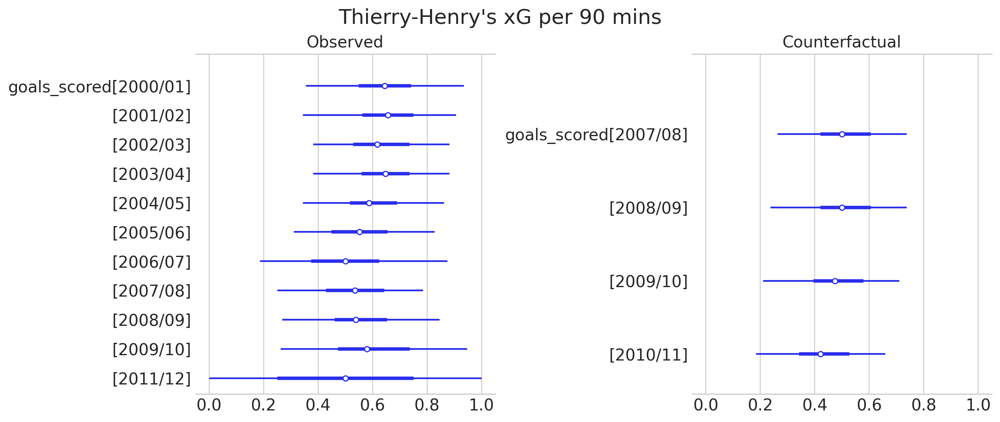

In [191]:
counterfactuals_factory.plot_forest_counterfactuals();

#### Arsenal counterfactual

In [316]:
ars_data = counterfactuals_factory.select_team_seasons("FC Arsenal", "2007/08", "2009/10")
ars_data

/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_54792/2582198640.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data["kick_off"] = pd.to_datetime(team_data["kick_off"], yearfirst=True).dt.normalize()
/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_54792/2582198640.py:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data["season_nbr"] = team_data["season"].factorize(sort=True)[0] + max_season_nbr
/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_54792/258219864

,name_team,name_league,season,season_nbr,kick_off,gameday,home_pitch,points_diff
0,FC Arsenal,premier-league,2007/08,7,2007-08-12,1,1.0,-0.703596
1,FC Arsenal,premier-league,2007/08,7,2007-08-19,2,0.0,-0.703596
2,FC Arsenal,premier-league,2007/08,7,2007-08-25,3,1.0,-1.045774
3,FC Arsenal,premier-league,2007/08,7,2007-09-02,4,1.0,-0.566725
4,FC Arsenal,premier-league,2007/08,7,2007-09-15,5,0.0,-0.292982
...,...,...,...,...,...,...,...,...
109,FC Arsenal,premier-league,2009/10,9,2010-04-14,34,0.0,0.186067
110,FC Arsenal,premier-league,2009/10,9,2010-04-18,35,0.0,1.965394
111,FC Arsenal,premier-league,2009/10,9,2010-04-24,36,1.0,-0.087675
112,FC Arsenal,premier-league,2009/10,9,2010-05-03,37,0.0,1.212602


In [195]:
ars_counterfactuals = counterfactuals_factory.sim_counterfactual(ars_data, SFM_rlp, idata, players_ordered, unique_gamedays)

/Users/alex_andorra/mambaforge/envs/football-models/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:377: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
Sampling: [goals_scored]


Output()

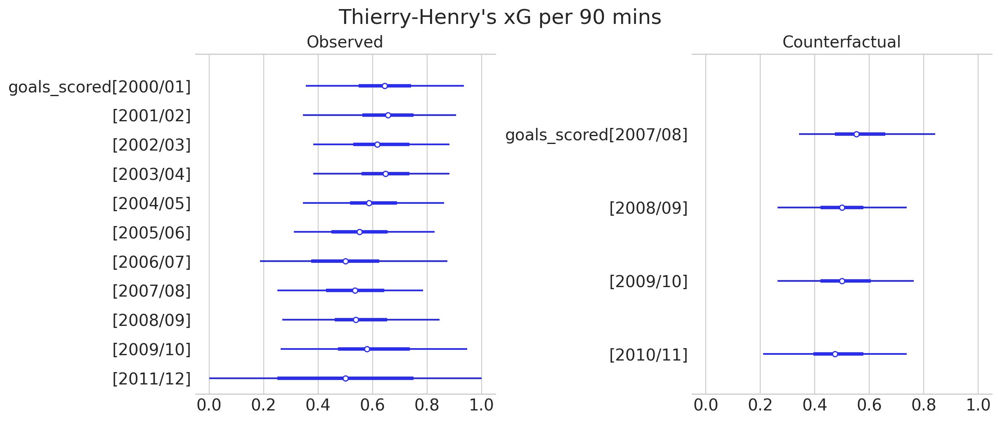

In [196]:
counterfactuals_factory.plot_forest_counterfactuals();

#### Comparison plots

In [258]:
player_goals = idata.posterior_predictive.sel(name_player=counterfactuals_factory.player_name)["goals_scored"]
av_goals = av_counterfactuals.predictions["goals_scored"]
ars_goals = ars_counterfactuals.predictions["goals_scored"]

# Find common seasons
common_seasons = np.intersect1d(player_goals['season'].data, av_goals['season'].data)

# restrict obs to common seasons
player_goals_filtered = player_goals.where(player_goals.season.isin(common_seasons), drop=True)

# restrict counterfactual to common seasons & gamedays
av_goals_filtered = av_goals.where(av_goals.season.isin(common_seasons), drop=True).sel(obs_id=player_goals_filtered.obs_id)
ars_goals_filtered = ars_goals.where(ars_goals.season.isin(common_seasons), drop=True).sel(obs_id=player_goals_filtered.obs_id)

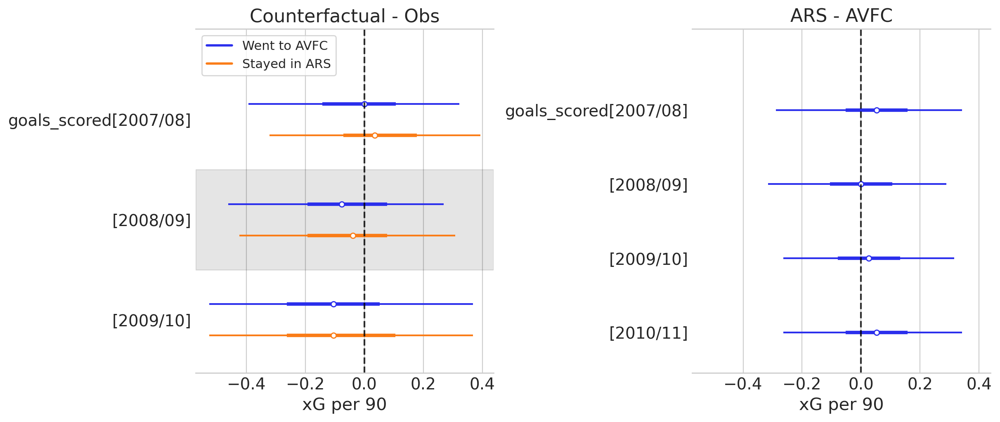

In [270]:
_, (left, right) = plt.subplots(1, 2, figsize=(12, 5), sharex=True, layout="constrained")
az.plot_forest(
    data=[
        (av_goals_filtered - player_goals_filtered).groupby("season").mean("obs_id"),
        (ars_goals_filtered - player_goals_filtered).groupby("season").mean("obs_id"),
    ],
    combined=True,
    ax=left,
)
left.axvline(c="k", ls="--", alpha=0.8)
left.set(title="Counterfactual - Obs", xlabel="xG per 90")

# create custom legend handles
handles = [
    mlines.Line2D([], [], color="C0", lw=2, label="Went to AVFC"),
    mlines.Line2D([], [], color="C1", lw=2, label="Stayed in ARS"),
]
# add legend to plot
left.legend(handles=handles, frameon=True, fontsize=11, loc="upper left");

az.plot_forest(
    (ars_goals - av_goals).groupby("season").mean("obs_id"),
    combined=True,
    ax=right,
)
right.axvline(c="k", ls="--", alpha=0.8)
right.set(title="ARS - AVFC", xlabel="xG per 90");

### CR7 counterfactual

In [333]:
cr_data = counterfactuals_factory.isolate_player("cristiano-ronaldo")

/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_54792/2582198640.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_data["kick_off"] = player_data["kick_off"].dt.normalize()


In [334]:
# limit to his transfer to RMFC
cr_data = cr_data[cr_data["season"] <= "2017/18"]
counterfactuals_factory.player_data = cr_data

In [335]:
# what if he had stayed in ManU?
manu_data = counterfactuals_factory.select_team_seasons("Manchester United", "2009/10", "2017/18")

/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_54792/2582198640.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data["kick_off"] = pd.to_datetime(team_data["kick_off"], yearfirst=True).dt.normalize()
/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_54792/2582198640.py:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_data["season_nbr"] = team_data["season"].factorize(sort=True)[0] + max_season_nbr
/var/folders/m_/brf3tky55f3gf6dy8w7c6s0w0000gn/T/ipykernel_54792/258219864

In [336]:
manu_counterfactuals = counterfactuals_factory.sim_counterfactual(manu_data, SFM_rlp, idata, players_ordered, unique_gamedays)

/Users/alex_andorra/mambaforge/envs/football-models/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:377: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
Sampling: [goals_scored]


Output()

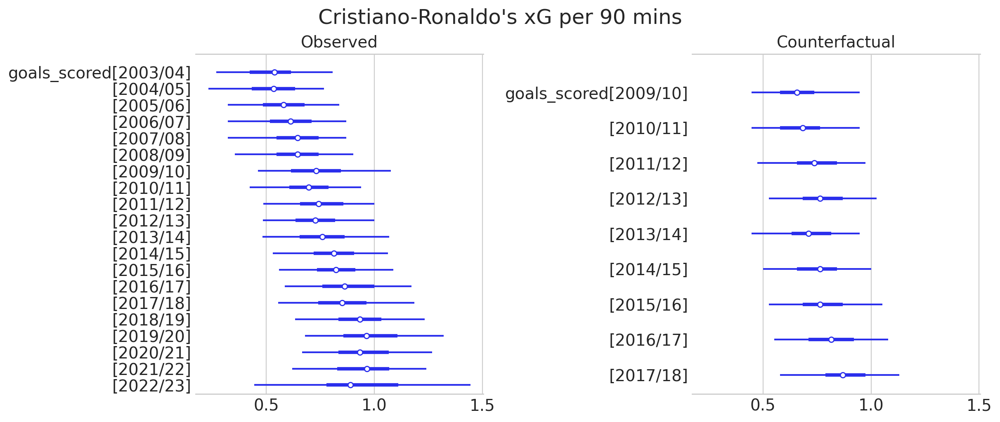

In [337]:
counterfactuals_factory.plot_forest_counterfactuals();

#### Comparison plot

In [339]:
player_goals = idata.posterior_predictive.sel(name_player=counterfactuals_factory.player_name)["goals_scored"]
manu_goals = manu_counterfactuals.predictions["goals_scored"]

# Find common seasons
common_seasons = np.intersect1d(player_goals['season'].data, manu_goals['season'].data)

# restrict obs to common seasons
player_goals_filtered = player_goals.where(player_goals.season.isin(common_seasons), drop=True)

# restrict counterfactual to common seasons & gamedays
manu_goals_filtered = manu_goals.where(manu_goals.season.isin(common_seasons), drop=True).sel(obs_id=player_goals_filtered.obs_id)

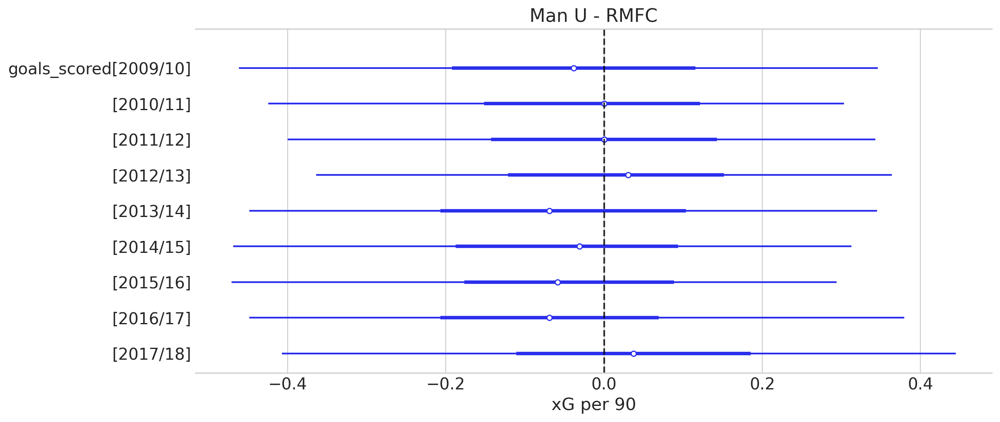

In [332]:
_, ax = plt.subplots(1, 1, figsize=(12, 5), sharex=True, layout="constrained")
az.plot_forest(
    (manu_goals_filtered - player_goals_filtered).groupby("season").mean("obs_id"),
    combined=True,
    ax=ax,
)
ax.axvline(c="k", ls="--", alpha=0.8)
ax.set(title="Man U - RMFC", xlabel="xG per 90");

## PAR Analysis

### From posterior samples

In [142]:
post_preds = idata.posterior_predictive.reset_index("obs_id")
rlp_perf = post_preds["goals_scored"].where(
    post_preds["name_player"].isin(coords["rlp"]), drop=True
)
elite_perf = post_preds["goals_scored"].where(
    post_preds["name_player"].isin(coords["elite"]), drop=True
)
par = (
    elite_perf.groupby("name_player").mean("obs_id") - rlp_perf.mean("obs_id")
).rename("PAR")

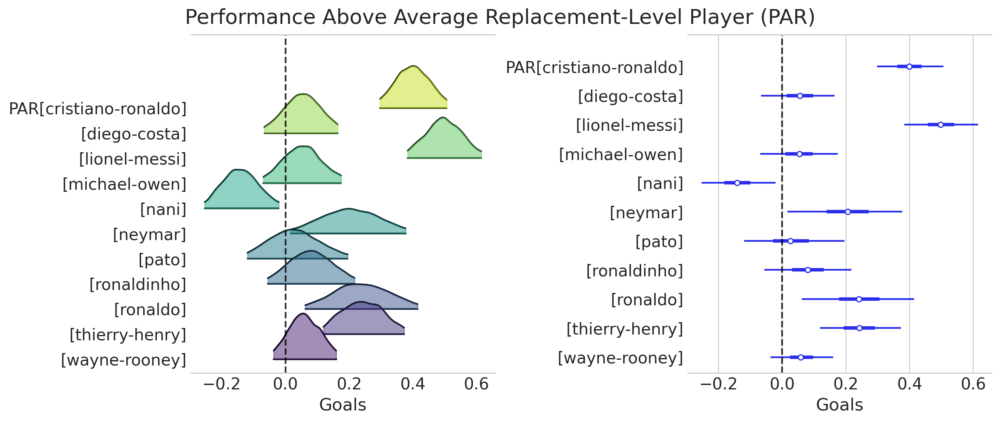

In [143]:
_, (left, right) = plt.subplots(1, 2, sharex=True)
az.plot_forest(
    par,
    combined=True,
    kind="ridgeplot",
    ridgeplot_overlap=1.5,
    ridgeplot_alpha=0.5,
    ax=left,
)
colors = sns.color_palette("viridis", n_colors=len(coords["elite"]))
# adjust colors manually
for patch, color in zip(left.collections, colors):
    patch.set_color(color)
left.axvline(c="k", ls="--", alpha=0.8)
left.set(title="", xlabel="Goals")

az.plot_forest(par, combined=True, ax=right)
right.axvline(c="k", ls="--", alpha=0.8)
right.set(title="", xlabel="Goals")
plt.suptitle("Performance Above Average Replacement-Level Player (PAR)", fontsize=18);

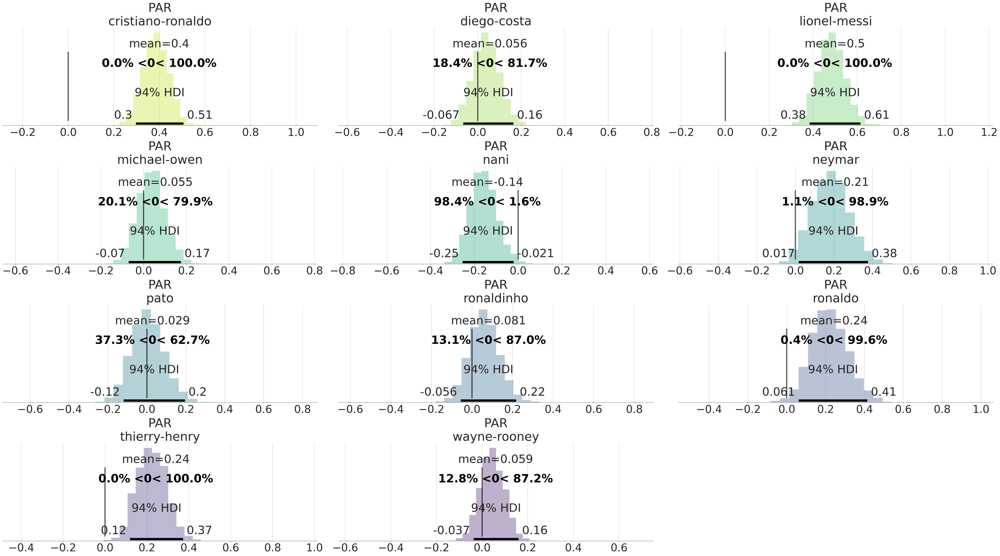

In [144]:
axes = az.plot_posterior(
    par,
    kind="hist",
    round_to=2,
    grid=(4, 3),
    textsize=32,
    ref_val=0,
    ref_val_color="k",
)

# customize bar colors
for ax, color in zip(axes.flatten(), colors[::-1]):
    for bar in ax.patches:
        bar.set_facecolor(color)

### From equal teams

In [161]:
preds = counterfact_preds.predictions["goals_scored"].unstack("obs_id")
rlp_perf = preds.where(preds["player"].isin(coords["rlp"]), drop=True)
elite_perf = preds.where(preds["player"].isin(coords["elite"]), drop=True)
pure_par = (
    elite_perf.groupby("player").mean(("season_nbr", "gameday")) - rlp_perf.mean(("player", "season_nbr", "gameday"))
).rename("PAR")

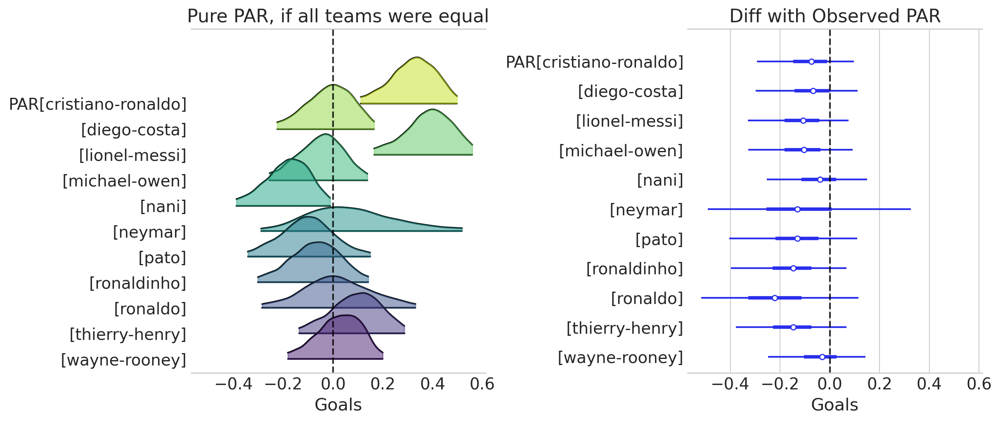

In [162]:
_, (left, right) = plt.subplots(1, 2, sharex=True)
az.plot_forest(
    pure_par,
    combined=True,
    kind="ridgeplot",
    ridgeplot_overlap=1.5,
    ridgeplot_alpha=0.5,
    ax=left,
)
colors = sns.color_palette("viridis", n_colors=len(coords["elite"]))
# adjust colors manually
for patch, color in zip(left.collections, colors):
    patch.set_color(color)
left.axvline(c="k", ls="--", alpha=0.8)
left.set(title="Pure PAR, if all teams were equal", xlabel="Goals")

az.plot_forest(pure_par - par.rename({"name_player": "player"}), combined=True, ax=right)
right.axvline(c="k", ls="--", alpha=0.8)
right.set(title="Diff with Observed PAR", xlabel="Goals");

## TO DO: 3D plot

## Packages versions

In [109]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Thu Jun 27 2024

Python implementation: CPython
Python version       : 3.11.9
IPython version      : 8.22.2

numpy     : 1.26.4
pandas    : 2.2.2
seaborn   : 0.13.2
matplotlib: 3.8.4
pymc      : 5.15.1+31.gf44071bd
xarray    : 2024.3.0
arviz     : 0.18.0
pytensor  : 2.22.1

Watermark: 2.4.3

